## Импорт библиотек

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline 
sns.set(style="ticks")

## Загрузка данных

In [2]:
data1 = pd.read_excel('Data1.xlsx')
data2 = pd.read_excel('Data2.xlsx')

In [3]:
(data1.shape, data2.shape)

((10000, 138), (10000, 138))

## Объединение таблиц

In [4]:
data = pd.concat([data1, data2], ignore_index=True, sort=False)

In [5]:
data.shape

(20000, 138)

In [6]:
# Список колонок
data.columns

Index(['№', 'Наименование', 'Регистрационный номер', 'Наименование полное',
       'Возраст компании, лет', 'Регион регистрации',
       'Вид деятельности/отрасль', 'ИДО', 'ИФР', 'ИПД',
       ...
       '2021, Рентабельность затрат, %',
       '2021, Доля себестоимости как процент от выручки, %',
       '2021, Рентабельность прибыли до налогообложения и процентов - (EBITM), %',
       '2021, Рентабельность активов (ROA), %',
       '2021, Рентабельность капитала (ROE), %',
       '2021, Рентабельность активов (п. 1.6 ст.105.8 НК РФ), %',
       '2021, Коэффициент текущей ликвидности, %',
       '2021, Доля краткосрочной в общем объеме задолженности, %',
       '2021, Коэффициент быстрой ликвидности, %',
       '2021, Коэффициент абсолютной ликвидности, %'],
      dtype='object', length=138)

## Проверка данных

In [7]:
# Список колонок с типами данных
data.dtypes

№                                                             int64
Наименование                                                 object
Регистрационный номер                                         int64
Наименование полное                                          object
Возраст компании, лет                                       float64
                                                             ...   
2021, Рентабельность активов (п. 1.6 ст.105.8 НК РФ), %     float64
2021, Коэффициент текущей ликвидности, %                    float64
2021, Доля краткосрочной в общем объеме задолженности, %    float64
2021, Коэффициент быстрой ликвидности, %                    float64
2021, Коэффициент абсолютной ликвидности, %                 float64
Length: 138, dtype: object

In [8]:
# Посмотрим данные нечисловые
data.select_dtypes('object').head()

,Наименование,Наименование полное,Регион регистрации,Вид деятельности/отрасль,"2021, Среднесписочная численность работников"
0,"#ЧИСТОЯГОДА, ООО","ОБЩЕСТВО С ОГРАНИЧЕННОЙ ОТВЕТСТВЕННОСТЬЮ ""#ЧИС...",Ленинградская область,Выращивание прочих плодовых и ягодных культур,1
1,"+33 КОРОВЫ, ООО","ОБЩЕСТВО С ОГРАНИЧЕННОЙ ОТВЕТСТВЕННОСТЬЮ ""+33 ...",Московская область,"Разведение молочного крупного рогатого скота, ...",4
2,"1 АКВАСТУДИЯ, ООО","ОБЩЕСТВО С ОГРАНИЧЕННОЙ ОТВЕТСТВЕННОСТЬЮ ""1 АК...",Москва,Рыбоводство пресноводное индустриальное,4
3,"1-Я ОРЛОВСКАЯ МТС, ООО","ОБЩЕСТВО С ОГРАНИЧЕННОЙ ОТВЕТСТВЕННОСТЬЮ ""1-Я ...",Орловская область,"Выращивание зерновых (кроме риса), зернобобовы...",13
4,"1-Я ТВЕРСКАЯ ЛЕСОХОЗЯЙСТВЕННАЯ КОМПАНИЯ, ООО","ОБЩЕСТВО С ОГРАНИЧЕННОЙ ОТВЕТСТВЕННОСТЬЮ ""1-Я ...",Тверская область,Лесоводство и прочая лесохозяйственная деятель...,10


In [9]:
#Число работников тут неверно определен. ИЗменим его тип. прдварительно уберем пробелы внутри чисел
data['2021, Среднесписочная численность работников']=data['2021, Среднесписочная численность работников'].str.replace(' ', '')
data['2021, Среднесписочная численность работников']=pd.to_numeric(data['2021, Среднесписочная численность работников'], downcast="integer")

In [10]:
# Посмотрим 
data.select_dtypes('object').head()

,Наименование,Наименование полное,Регион регистрации,Вид деятельности/отрасль
0,"#ЧИСТОЯГОДА, ООО","ОБЩЕСТВО С ОГРАНИЧЕННОЙ ОТВЕТСТВЕННОСТЬЮ ""#ЧИС...",Ленинградская область,Выращивание прочих плодовых и ягодных культур
1,"+33 КОРОВЫ, ООО","ОБЩЕСТВО С ОГРАНИЧЕННОЙ ОТВЕТСТВЕННОСТЬЮ ""+33 ...",Московская область,"Разведение молочного крупного рогатого скота, ..."
2,"1 АКВАСТУДИЯ, ООО","ОБЩЕСТВО С ОГРАНИЧЕННОЙ ОТВЕТСТВЕННОСТЬЮ ""1 АК...",Москва,Рыбоводство пресноводное индустриальное
3,"1-Я ОРЛОВСКАЯ МТС, ООО","ОБЩЕСТВО С ОГРАНИЧЕННОЙ ОТВЕТСТВЕННОСТЬЮ ""1-Я ...",Орловская область,"Выращивание зерновых (кроме риса), зернобобовы..."
4,"1-Я ТВЕРСКАЯ ЛЕСОХОЗЯЙСТВЕННАЯ КОМПАНИЯ, ООО","ОБЩЕСТВО С ОГРАНИЧЕННОЙ ОТВЕТСТВЕННОСТЬЮ ""1-Я ...",Тверская область,Лесоводство и прочая лесохозяйственная деятель...


## Работа с пропусками

In [11]:
# проверим есть ли пропущенные значения
data.isnull().sum()

№                                                               0
Наименование                                                    0
Регистрационный номер                                           0
Наименование полное                                             0
Возраст компании, лет                                           0
                                                            ...  
2021, Рентабельность активов (п. 1.6 ст.105.8 НК РФ), %      7301
2021, Коэффициент текущей ликвидности, %                     1274
2021, Доля краткосрочной в общем объеме задолженности, %    10555
2021, Коэффициент быстрой ликвидности, %                     1476
2021, Коэффициент абсолютной ликвидности, %                  2366
Length: 138, dtype: int64

In [12]:
# Удаление колонок, содержащих пустые значения
data_new_1 = data.dropna(axis=1, how='any')
(data.shape, data_new_1.shape)

((20000, 138), (20000, 10))

In [13]:
# Посчитаем процент пропусков по числовым столбцам
num_cols = []
total_count = data.shape[0]
for col in data.columns:
    # Количество пустых значений 
    temp_null_count = data[data[col].isnull()].shape[0]
    dt = str(data[col].dtype)
    if temp_null_count>0 and (dt=='float64' or dt=='int64'):
        num_cols.append(col)
        temp_perc = round((temp_null_count / total_count) * 100.0, 2)
        print('{} . Тип данных {}. Количество пустых значений {}, {}%.'.format(col, dt, temp_null_count, temp_perc))

ИФР . Тип данных float64. Количество пустых значений 3, 0.01%.
ИПД . Тип данных float64. Количество пустых значений 19044, 95.22%.
Уставный капитал, RUB . Тип данных float64. Количество пустых значений 8, 0.04%.
2021, Доходы, RUB . Тип данных float64. Количество пустых значений 25, 0.12%.
2021, Расходы, RUB . Тип данных float64. Количество пустых значений 25, 0.12%.
2021, Налоги, RUB . Тип данных float64. Количество пустых значений 386, 1.93%.
2021, Нематериальные активы, RUB . Тип данных float64. Количество пустых значений 19285, 96.43%.
2021, Основные средства , RUB . Тип данных float64. Количество пустых значений 4441, 22.2%.
2021, Доходные вложения в материальные ценности, RUB . Тип данных float64. Количество пустых значений 19574, 97.87%.
2021, Долгосрочные финансовые вложения, RUB . Тип данных float64. Количество пустых значений 17655, 88.28%.
2021, Отложенные налоговые активы, RUB . Тип данных float64. Количество пустых значений 19120, 95.6%.
2021, Прочие внеоборотные активы, RU

In [14]:
#Для ряда показателей формы 1-2 отчетности данные вносятся в обязательном порядке, поэтому пропуск означает, что этот показатель равен 0. Произведем по ним замену
#Выберем эти столбцы
x_col_list = ['2021, Нематериальные активы, RUB', '2021, Основные средства , RUB','2021, Доходные вложения в материальные ценности, RUB', '2021, Долгосрочные финансовые вложения, RUB', '2021, Отложенные налоговые активы, RUB', '2021, Прочие внеоборотные активы, RUB', '2021, Внеоборотные активы, RUB', '2021, Запасы, RUB', '2021, Чистые активы, RUB', '2021, НДС по приобретенным ценностям , RUB', '2021, Дебиторская задолженность, RUB', '2021, Краткосрочные финансовые вложения, RUB', '2021, Денежные средства и денежные эквиваленты, RUB', '2021, Прочие оборотные активы, RUB', '2021, Оборотные активы, RUB', '2021, Активы  всего, RUB', '2021, Уставный капитал , RUB',  '2021, Собственные акции, выкупленные у акционеров, RUB', '2021, Переоценка внеоборотных активов, RUB', '2021, Добавочный капитал, RUB', '2021, Резервный капитал, RUB', '2021, Нераспределенная прибыль (непокрытый убыток), RUB', '2021, Капитал и резервы, RUB', '2021, Заёмные средства (долгосрочные), RUB', '2021, Отложенные налоговые обязательства, RUB', '2021, Прочие долгосрочные обязательства, RUB', '2021, Долгосрочные обязательства, RUB', '2021, Заёмные средства (краткосрочные), RUB', '2021, Кредиторская задолженность, RUB', '2021, Доходы будущих периодов , RUB', '2021, Заёмные средства (краткосрочные), RUB', '2021, Кредиторская задолженность, RUB', '2021, Доходы будущих периодов , RUB', '2021, Прочие краткосрочные обязательства, RUB', '2021, Краткосрочные обязательства, RUB', '2021, Пассивы всего, RUB', '2021, Собственный оборотный капитал, RUB',  '2021, Собственный капитал, RUB', '2021, Совокупный долг, RUB', '2021, Себестоимость продаж, RUB', '2021, Валовая прибыль (убыток), RUB','2021, Коммерческие расходы, RUB', '2021, Управленческие расходы, RUB', '2021, Прибыль (убыток) от продажи, RUB', '2021, Доходы от участия в других организациях, RUB', '2021, Проценты к получению, RUB', '2021, Проценты к уплате, RUB', '2021, Прочие доходы, RUB', '2021, Прочие расходы, RUB', '2021, Прибыль (убыток) до налогообложения , RUB', '2021, Текущий налог на прибыль, RUB', '2021, Чистая прибыль (убыток), RUB', '2021, EBIT, RUB', '2021, Поступления от текущих операций, RUB', '2021, Поступления от продаж, RUB', '2021, Поступления арендных, лицензионных, комиссионных платежей, роялти, RUB', '2021, Поступления от перепродажи финансовых вложений, RUB', '2021, Платежи по текущим операциям, RUB', '2021, Платежи поставщикам и подрядчикам, RUB', '2021, Оплата труда, RUB', '2021, Оплата процентов по долговым обязательствам, RUB', '2021, Налог на прибыль, RUB', '2021, Сальдо денежных потоков от текущих операций, RUB', '2021, Поступления от инвестиционных операций, RUB', '2021, Продажа внеоборотных активов, RUB','2021, Продажа акций других организаций, RUB', '2021, Поступления от возврата займов, продажи долговых ценных бумаг, RUB', '2021, Получение дивидендов, процентов, RUB', '2021, Платежи по инвестиционным операциям, RUB', '2021, Приобретение внеоборотных активов, RUB', '2021, Приобретение акций (долей участия), RUB', '2021, Приобретение долговых ценных бумаг, предоставление займов, RUB', '2021, Платежи по процентам, RUB', '2021, Сальдо денежных потоков от инвестиционных операций, RUB', '2021, Поступления от финансовых операций, RUB', '2021, Получение кредитов и займов, RUB', '2021, Поступление денежных вкладов собственников (участников), RUB', '2021, Поступления от выпуска акций, увеличения долей участия, RUB', '2021, Поступления от выпуска облигаций, векселей и других долговых ценных бумаг и др., RUB', '2021, Платежи по финансовым операциям, RUB', '2021, Выкуп акций (долей) у собственников, RUB', '2021, Выплата дивидендов, RUB', '2021, Погашение векселей, возврат кредитов и займов, RUB', '2021, Сальдо денежных потоков от финансовых операций, RUB', '2021, Сальдо денежных потоков за отчетный период, RUB', '2021, Поступление денежных средств всего, RUB']

for col in x_col_list:
   data[col]=data[col].fillna(0) 
data


,№,Наименование,Регистрационный номер,Наименование полное,"Возраст компании, лет",Регион регистрации,Вид деятельности/отрасль,ИДО,ИФР,ИПД,...,"2021, Рентабельность затрат, %","2021, Доля себестоимости как процент от выручки, %","2021, Рентабельность прибыли до налогообложения и процентов - (EBITM), %","2021, Рентабельность активов (ROA), %","2021, Рентабельность капитала (ROE), %","2021, Рентабельность активов (п. 1.6 ст.105.8 НК РФ), %","2021, Коэффициент текущей ликвидности, %","2021, Доля краткосрочной в общем объеме задолженности, %","2021, Коэффициент быстрой ликвидности, %","2021, Коэффициент абсолютной ликвидности, %"
0,1,"#ЧИСТОЯГОДА, ООО",1187746515406,"ОБЩЕСТВО С ОГРАНИЧЕННОЙ ОТВЕТСТВЕННОСТЬЮ ""#ЧИС...",4.5,Ленинградская область,Выращивание прочих плодовых и ягодных культур,52,90.0,NaN,...,0.0520,0.9505,NaN,0.0014,0.7000,NaN,1.6047,0.4173,0.8931,0.0007
1,2,"+33 КОРОВЫ, ООО",1205000040420,"ОБЩЕСТВО С ОГРАНИЧЕННОЙ ОТВЕТСТВЕННОСТЬЮ ""+33 ...",2.5,Московская область,"Разведение молочного крупного рогатого скота, ...",52,97.0,NaN,...,-0.1256,1.1436,-0.0394,-0.0273,-0.1079,-0.0966,0.4195,1.0000,0.0929,NaN
2,3,"1 АКВАСТУДИЯ, ООО",1037739380766,"ОБЩЕСТВО С ОГРАНИЧЕННОЙ ОТВЕТСТВЕННОСТЬЮ ""1 АК...",20.5,Москва,Рыбоводство пресноводное индустриальное,19,15.0,NaN,...,0.0582,0.9450,NaN,0.0031,0.0048,NaN,2.9058,NaN,1.2111,0.3178
3,4,"1-Я ОРЛОВСКАЯ МТС, ООО",1155749005257,"ОБЩЕСТВО С ОГРАНИЧЕННОЙ ОТВЕТСТВЕННОСТЬЮ ""1-Я ...",7.5,Орловская область,"Выращивание зерновых (кроме риса), зернобобовы...",18,11.0,NaN,...,0.3487,0.7414,NaN,0.2698,0.6934,NaN,1.4937,NaN,1.2898,0.3761
4,5,"1-Я ТВЕРСКАЯ ЛЕСОХОЗЯЙСТВЕННАЯ КОМПАНИЯ, ООО",1096952022420,"ОБЩЕСТВО С ОГРАНИЧЕННОЙ ОТВЕТСТВЕННОСТЬЮ ""1-Я ...",13.0,Тверская область,Лесоводство и прочая лесохозяйственная деятель...,18,90.0,NaN,...,-0.2330,1.3037,NaN,-0.5684,-366.5000,NaN,1.0030,1.0000,1.0030,0.0024
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,9996,"ОРЕЛАГРОЮГ, АО",1085742000629,"АКЦИОНЕРНОЕ ОБЩЕСТВО ""ОРЕЛАГРОЮГ""",14.5,Орловская область,"Выращивание зерновых (кроме риса), зернобобовы...",1,26.0,NaN,...,0.5973,0.5090,0.2121,0.0825,0.1016,0.1510,4.1202,0.8989,2.9950,0.5383
19996,9997,"ОРЕЛАГРОПРОМ, ООО",1085742000079,"ОБЩЕСТВО С ОГРАНИЧЕННОЙ ОТВЕТСТВЕННОСТЬЮ ""ОРЕЛ...",14.5,Орловская область,"Выращивание зерновых (кроме риса), зернобобовы...",1,20.0,NaN,...,0.9644,0.4294,0.4591,0.3052,0.5163,0.3311,1.8502,0.6580,0.8782,0.0564
19997,9998,"ОРЕЛАГРОИНВЕСТ, ООО",1055746015060,"ОБЩЕСТВО С ОГРАНИЧЕННОЙ ОТВЕТСТВЕННОСТЬЮ ""ОРЕЛ...",17.0,Орловская область,Выращивание сахарной свеклы,1,60.0,NaN,...,1.2310,0.4328,0.5423,0.3836,0.8179,0.7426,2.2208,0.0909,0.8943,0.2565
19998,9999,"ОРЕЛАГРОАКТИВ, ООО",1175749011173,"ОБЩЕСТВО С ОГРАНИЧЕННОЙ ОТВЕТСТВЕННОСТЬЮ ""ОРЕЛ...",5.0,Орловская область,"Выращивание зерновых (кроме риса), зернобобовы...",2,8.0,NaN,...,1.4916,0.3963,0.5467,0.3901,0.6717,0.3505,4.3170,0.2190,1.9757,0.7340


In [15]:
# Посчитаем процент пропусков по числовым столбцам в новом наборе данных
num_cols = []
total_count = data.shape[0]
for col in data.columns:
    # Количество пустых значений 
    temp_null_count = data[data[col].isnull()].shape[0]
    dt = str(data[col].dtype)
    if temp_null_count>0 and (dt=='float64' or dt=='int64'):
        num_cols.append(col)
        temp_perc = round((temp_null_count / total_count) * 100.0, 2)
        print('{} . Тип данных {}. Количество пустых значений {}, {}%.'.format(col, dt, temp_null_count, temp_perc))

ИФР . Тип данных float64. Количество пустых значений 3, 0.01%.
ИПД . Тип данных float64. Количество пустых значений 19044, 95.22%.
Уставный капитал, RUB . Тип данных float64. Количество пустых значений 8, 0.04%.
2021, Доходы, RUB . Тип данных float64. Количество пустых значений 25, 0.12%.
2021, Расходы, RUB . Тип данных float64. Количество пустых значений 25, 0.12%.
2021, Налоги, RUB . Тип данных float64. Количество пустых значений 386, 1.93%.
2021, Период погашения кредиторской задолженности, дни . Тип данных float64. Количество пустых значений 1923, 9.62%.
2021, Оборачиваемость кредиторской задолженности, разы . Тип данных float64. Количество пустых значений 1808, 9.04%.
2021, Период оборота запасов, дни . Тип данных float64. Количество пустых значений 2873, 14.37%.
2021, Оборачиваемость запасов, разы . Тип данных float64. Количество пустых значений 3116, 15.58%.
2021, Период погашения дебиторской задолженности, дни . Тип данных float64. Количество пустых значений 2024, 10.12%.
2021,

In [16]:
#удалим столбцы где много пропусков (больше 5%)
data_1 = data.dropna(thresh=int(len(data) * .95), axis=1)


In [17]:
#Проверим процент пропусков в новых данных
# Выберем числовые колонки с пропущенными значениями
# Цикл по колонкам датасета
num_cols = []
for col in data_1.columns:
    # Количество пустых значений 
    temp_null_count = data_1[data_1[col].isnull()].shape[0]
    dt = str(data_1[col].dtype)
    if temp_null_count>0 and (dt=='float64' or dt=='int64'):
        num_cols.append(col)
        temp_perc = round((temp_null_count / total_count) * 100.0, 2)
        print('Колонка {}. Тип данных {}. Количество пустых значений {}, {}%.'.format(col, dt, temp_null_count, temp_perc))



Колонка ИФР. Тип данных float64. Количество пустых значений 3, 0.01%.
Колонка Уставный капитал, RUB. Тип данных float64. Количество пустых значений 8, 0.04%.
Колонка 2021, Доходы, RUB. Тип данных float64. Количество пустых значений 25, 0.12%.
Колонка 2021, Расходы, RUB. Тип данных float64. Количество пустых значений 25, 0.12%.
Колонка 2021, Налоги, RUB. Тип данных float64. Количество пустых значений 386, 1.93%.
Колонка 2021, Период оборота активов, дни. Тип данных float64. Количество пустых значений 65, 0.33%.
Колонка 2021, Доля рабочего капитала в активах компании, %. Тип данных float64. Количество пустых значений 162, 0.81%.
Колонка 2021, Коэффициент оборачиваемости совокупных активов, %. Тип данных float64. Количество пустых значений 53, 0.27%.
Колонка 2021, Соотношение чистого долга к капиталу, %. Тип данных float64. Количество пустых значений 882, 4.41%.
Колонка 2021, Коэффициент концентрации собственного капитала (автономии), %. Тип данных float64. Количество пустых значений 134,

In [18]:
# Замена переменных по этим столбцам не корректна (может сильно исказить результаты.
# Удаление строк, содержащих пустые значения
data_2 = data_1.dropna(axis=0, how='any')
(data_2.shape, data_1.shape)

((17821, 111), (20000, 111))

In [19]:
# Список колонок
data_2.columns

Index(['№', 'Наименование', 'Регистрационный номер', 'Наименование полное',
       'Возраст компании, лет', 'Регион регистрации',
       'Вид деятельности/отрасль', 'ИДО', 'ИФР',
       '2021, Среднесписочная численность работников',
       ...
       '2021, Соотношение чистого долга к капиталу, %',
       '2021, Коэффициент концентрации собственного капитала (автономии), %',
       '2021, Коэффициент маневренности собственных средств, %',
       '2021, Коэффициент обеспеченности собственными оборотными средствами, %',
       '2021, Чистая норма прибыли, %', '2021, Рентабельность продаж, %',
       '2021, Рентабельность затрат, %',
       '2021, Доля себестоимости как процент от выручки, %',
       '2021, Рентабельность активов (ROA), %',
       '2021, Рентабельность капитала (ROE), %'],
      dtype='object', length=111)

In [20]:
# Выгрузим данные в отдельный файл чтобы сохранить промежуточный этап работы
data_2.to_csv('data_2.csv')

## Расчет системы показателей

In [21]:
#расчитаем относительные показатели для модели
data_2['Прибыль в расчете на 1 работника']=data_2['2021, Прибыль (убыток) от продажи, RUB']/data_2['2021, Среднесписочная численность работников']
data_2['Оборотный капитал на 1 работника']=data_2['2021, Собственный оборотный капитал, RUB']/data_2['2021, Среднесписочная численность работников']
data_2['Чистые активы на 1 работника']=data_2['2021, Чистые активы, RUB']/data_2['2021, Среднесписочная численность работников']
data_2['Совокупный долг на 1 работника']=data_2['2021, Совокупный долг, RUB']/data_2['2021, Среднесписочная численность работников']
data_2['Налоговая нагрузка']=data_2['2021, Налоги, RUB']/data_2['2021, Выручка, RUB']
data_2['Выручка на 1 рубль активов']=data_2['2021, Выручка, RUB']/data_2['2021, Активы  всего, RUB']
data_2['Налоги на 1 работника']=data_2['2021, Налоги, RUB']/data_2['2021, Среднесписочная численность работников']
data_2['Кредиторская задолженность на 1 работника']=data_2['2021, Кредиторская задолженность, RUB']/data_2['2021, Среднесписочная численность работников']
data_2['НАлоги на 1 руб себестоимости']=data_2['2021, Налоги, RUB']/data_2['2021, Себестоимость продаж, RUB']
data_2['Фондовооруженность']=data_2['2021, Основные средства , RUB']/data_2['2021, Среднесписочная численность работников']
data_2['Доля внеоборотных активов в общих']=data_2['2021, Внеоборотные активы, RUB']/data_2['2021, Активы  всего, RUB']

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1948169434.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_2['Прибыль в расчете на 1 работника']=data_2['2021, Прибыль (убыток) от продажи, RUB']/data_2['2021, Среднесписочная численность работников']
C:\Users\user\AppData\Local\Temp\ipykernel_8304\1948169434.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_2['Оборотный капитал на 1 работника']=data_2['2021, Собственный оборотный капитал, RUB']/data_2['2021, Среднесписочная численность работни

In [22]:
data_2.head()

,№,Наименование,Регистрационный номер,Наименование полное,"Возраст компании, лет",Регион регистрации,Вид деятельности/отрасль,ИДО,ИФР,"2021, Среднесписочная численность работников",...,Оборотный капитал на 1 работника,Чистые активы на 1 работника,Совокупный долг на 1 работника,Налоговая нагрузка,Выручка на 1 рубль активов,Налоги на 1 работника,Кредиторская задолженность на 1 работника,НАлоги на 1 руб себестоимости,Фондовооруженность,Доля внеоборотных активов в общих
0,1,"#ЧИСТОЯГОДА, ООО",1187746515406,"ОБЩЕСТВО С ОГРАНИЧЕННОЙ ОТВЕТСТВЕННОСТЬЮ ""#ЧИС...",4.5,Ленинградская область,Выращивание прочих плодовых и ягодных культур,52,90.0,1,...,4.585000e+06,1.000000e+04,7.091000e+06,0.174699,0.219265,272007.000000,2.516000e+06,0.183789,0.000000e+00,0.000000
1,2,"+33 КОРОВЫ, ООО",1205000040420,"ОБЩЕСТВО С ОГРАНИЧЕННОЙ ОТВЕТСТВЕННОСТЬЮ ""+33 ...",2.5,Московская область,"Разведение молочного крупного рогатого скота, ...",52,97.0,4,...,2.667500e+05,7.007500e+05,2.137000e+06,0.040449,0.641001,73576.000000,4.970000e+05,0.035369,1.941250e+06,0.684081
2,3,"1 АКВАСТУДИЯ, ООО",1037739380766,"ОБЩЕСТВО С ОГРАНИЧЕННОЙ ОТВЕТСТВЕННОСТЬЮ ""1 АК...",20.5,Москва,Рыбоводство пресноводное индустриальное,19,15.0,4,...,4.197500e+05,4.197500e+05,2.202500e+05,0.096504,1.576953,97397.000000,2.202500e+05,0.102120,0.000000e+00,0.000000
3,4,"1-Я ОРЛОВСКАЯ МТС, ООО",1155749005257,"ОБЩЕСТВО С ОГРАНИЧЕННОЙ ОТВЕТСТВЕННОСТЬЮ ""1-Я ...",7.5,Орловская область,"Выращивание зерновых (кроме риса), зернобобовы...",18,11.0,13,...,1.119769e+06,2.005769e+06,3.150077e+06,0.027554,1.092621,155220.846154,2.267923e+06,0.037162,1.767154e+06,0.342942
4,5,"1-Я ТВЕРСКАЯ ЛЕСОХОЗЯЙСТВЕННАЯ КОМПАНИЯ, ООО",1096952022420,"ОБЩЕСТВО С ОГРАНИЧЕННОЙ ОТВЕТСТВЕННОСТЬЮ ""1-Я ...",13.0,Тверская область,Лесоводство и прочая лесохозяйственная деятель...,18,90.0,10,...,3.100000e+04,1.000000e+03,3.350000e+05,0.073065,3.476488,85346.700000,3.050000e+05,0.056042,0.000000e+00,0.000000


In [23]:
# Выберем список относительных показателей, которые нам понадобятся для построения модели для проверки выбросов
x_col_list2 = ['Прибыль в расчете на 1 работника', 'Возраст компании, лет','Оборотный капитал на 1 работника','Чистые активы на 1 работника', 'Совокупный долг на 1 работника', 'Налоговая нагрузка', 'Выручка на 1 рубль активов', 'Налоги на 1 работника','Кредиторская задолженность на 1 работника', 'НАлоги на 1 руб себестоимости', 'Фондовооруженность','Доля внеоборотных активов в общих', '2021, Доля рабочего капитала в активах компании, %',  '2021, Коэффициент оборачиваемости совокупных активов, %', '2021, Соотношение чистого долга к капиталу, %', '2021, Коэффициент концентрации собственного капитала (автономии), %', '2021, Коэффициент маневренности собственных средств, %', '2021, Коэффициент обеспеченности собственными оборотными средствами, %', '2021, Рентабельность затрат, %', '2021, Доля себестоимости как процент от выручки, %', '2021, Рентабельность активов (ROA), %', '2021, Рентабельность капитала (ROE), %']
data_all=data_2[x_col_list2]
data_all.head()

,Прибыль в расчете на 1 работника,"Возраст компании, лет",Оборотный капитал на 1 работника,Чистые активы на 1 работника,Совокупный долг на 1 работника,Налоговая нагрузка,Выручка на 1 рубль активов,Налоги на 1 работника,Кредиторская задолженность на 1 работника,НАлоги на 1 руб себестоимости,...,"2021, Доля рабочего капитала в активах компании, %","2021, Коэффициент оборачиваемости совокупных активов, %","2021, Соотношение чистого долга к капиталу, %","2021, Коэффициент концентрации собственного капитала (автономии), %","2021, Коэффициент маневренности собственных средств, %","2021, Коэффициент обеспеченности собственными оборотными средствами, %","2021, Рентабельность затрат, %","2021, Доля себестоимости как процент от выручки, %","2021, Рентабельность активов (ROA), %","2021, Рентабельность капитала (ROE), %"
0,7.700000e+04,4.5,4.585000e+06,1.000000e+04,7.091000e+06,0.174699,0.219265,272007.000000,2.516000e+06,0.183789,...,0.3768,0.3088,457.2000,0.0014,1.0000,0.0014,0.0520,0.9505,0.0014,0.7000
1,-2.612500e+05,2.5,2.667500e+05,7.007500e+05,2.137000e+06,0.040449,0.641001,73576.000000,4.970000e+05,0.035369,...,-0.4371,0.6926,2.3403,0.2469,-1.7702,-1.3837,-0.1256,1.1436,-0.0273,-0.1079
2,5.550000e+04,20.5,4.197500e+05,4.197500e+05,2.202500e+05,0.096504,1.576953,97397.000000,2.202500e+05,0.102120,...,0.6559,1.5453,-0.1668,0.6559,1.0000,0.6559,0.0582,0.9450,0.0031,0.0048
3,1.456538e+06,7.5,1.119769e+06,2.005769e+06,3.150077e+06,0.027554,1.092621,155220.846154,2.267923e+06,0.037162,...,0.2172,1.4180,0.0098,0.3890,0.1185,0.0701,0.3487,0.7414,0.2698,0.6934
4,-3.548000e+05,13.0,3.100000e+04,1.000000e+03,3.350000e+05,0.073065,3.476488,85346.700000,3.050000e+05,0.056042,...,0.0030,1.8116,29.2000,0.0030,1.0000,0.0030,-0.2330,1.3037,-0.5684,-366.5000


In [24]:
# Основные статистические характеристки набора данных
data_all.describe()

,Прибыль в расчете на 1 работника,"Возраст компании, лет",Оборотный капитал на 1 работника,Чистые активы на 1 работника,Совокупный долг на 1 работника,Налоговая нагрузка,Выручка на 1 рубль активов,Налоги на 1 работника,Кредиторская задолженность на 1 работника,НАлоги на 1 руб себестоимости,...,"2021, Доля рабочего капитала в активах компании, %","2021, Коэффициент оборачиваемости совокупных активов, %","2021, Соотношение чистого долга к капиталу, %","2021, Коэффициент концентрации собственного капитала (автономии), %","2021, Коэффициент маневренности собственных средств, %","2021, Коэффициент обеспеченности собственными оборотными средствами, %","2021, Рентабельность затрат, %","2021, Доля себестоимости как процент от выручки, %","2021, Рентабельность активов (ROA), %","2021, Рентабельность капитала (ROE), %"
count,1.782100e+04,17821.000000,1.782100e+04,1.782100e+04,1.782100e+04,17821.000000,17821.000000,1.782100e+04,1.782100e+04,17821.000000,...,17821.000000,17821.000000,17821.000000,17821.000000,17821.000000,17821.000000,17821.000000,17821.000000,17821.000000,17821.000000
mean,1.248437e+06,14.407862,1.959655e+06,3.177732e+06,1.020785e+07,0.354084,3.723376,3.369981e+05,4.675680e+06,0.479008,...,-1.689843,2.236178,4.926333,-1.830994,-3.516386,-7.742089,0.830293,2.195708,0.081538,0.848414
std,1.663880e+07,8.368516,8.968357e+07,7.846588e+07,1.174726e+08,6.175596,77.862137,2.293961e+06,9.993716e+07,20.919695,...,118.510989,13.924293,150.952524,119.108085,96.191276,212.903469,31.897305,34.793166,3.645679,37.482477
min,-1.456467e+09,1.000000,-8.137725e+09,-5.549908e+09,-1.352300e+07,0.000000,-7.164179,0.000000e+00,-3.445333e+06,-0.059694,...,-14575.000000,-35.761900,-4514.000000,-14575.000000,-6589.700000,-16205.000000,-8.883000,-0.655700,-324.857100,-3497.818200
25%,3.162791e+03,7.500000,2.462222e+05,2.370000e+05,3.540000e+05,0.026647,0.337654,7.061871e+04,6.600000e+04,0.034464,...,0.053000,0.356100,-0.212000,0.138100,0.097200,-0.352000,0.002800,0.632700,0.002200,0.021400
50%,2.409545e+05,14.000000,1.327208e+06,1.832000e+06,1.592545e+06,0.052810,0.614693,1.174081e+05,3.533509e+05,0.066888,...,0.337600,0.667700,0.000700,0.581800,0.572100,0.306200,0.116600,0.841900,0.072700,0.188500
75%,1.147667e+06,20.000000,3.552000e+06,5.197870e+06,5.135643e+06,0.101403,1.250256,2.200112e+05,1.491012e+06,0.125290,...,0.588900,1.404200,0.370000,0.861400,1.000000,0.772200,0.428400,0.977600,0.227100,0.551400
max,8.655915e+08,95.500000,9.953140e+08,1.326916e+09,1.001313e+10,569.739851,6231.000000,1.560115e+08,1.001313e+10,2744.963000,...,30.447300,701.500000,10011.900000,16.569900,1663.500000,98.201600,3269.200000,3346.000000,143.000000,1572.000000


## Поиск выбросов

In [25]:
import scipy.stats as stats
def diagnostic_plots(df, variable, title):
    fig, ax = plt.subplots(figsize=(10,7))
    # гистограмма
    plt.subplot(2, 2, 1)
    df[variable].hist(bins=30)
    ## Q-Q plot
    plt.subplot(2, 2, 2)
    stats.probplot(df[variable], dist="norm", plot=plt)
    # ящик с усами
    plt.subplot(2, 2, 3)
    sns.violinplot(x=df[variable])    
    # ящик с усами
    plt.subplot(2, 2, 4)
    sns.boxplot(x=df[variable])  
    fig.suptitle(title)
    plt.show()

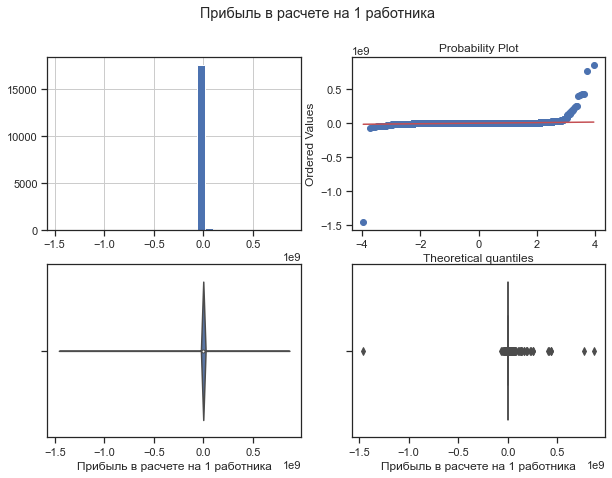

In [26]:
diagnostic_plots(data_all, 'Прибыль в расчете на 1 работника', 'Прибыль в расчете на 1 работника')

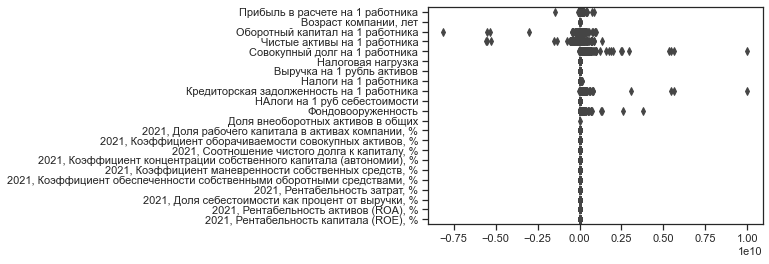

In [27]:
sns.boxplot(data = data_all, orient="h")
plt.show()

In [28]:
# оценка наличия,количества выбросов в столбцах исходного dataset
from matplotlib.cbook import boxplot_stats
plt.figure(figsize=(20, 40))
i=1 
for name in data_all.columns:
    outlier = boxplot_stats(data_all[name])
    print ('Количество выбросов в столбце ', name, ': ', len(outlier[0]['fliers']))
    i +=1

Количество выбросов в столбце  Прибыль в расчете на 1 работника :  2455
Количество выбросов в столбце  Возраст компании, лет :  14
Количество выбросов в столбце  Оборотный капитал на 1 работника :  2042
Количество выбросов в столбце  Чистые активы на 1 работника :  1924
Количество выбросов в столбце  Совокупный долг на 1 работника :  2031
Количество выбросов в столбце  Налоговая нагрузка :  1957
Количество выбросов в столбце  Выручка на 1 рубль активов :  2116
Количество выбросов в столбце  Налоги на 1 работника :  2033
Количество выбросов в столбце  Кредиторская задолженность на 1 работника :  2365
Количество выбросов в столбце  НАлоги на 1 руб себестоимости :  1681
Количество выбросов в столбце  Фондовооруженность :  1577
Количество выбросов в столбце  Доля внеоборотных активов в общих :  1
Количество выбросов в столбце  2021, Доля рабочего капитала в активах компании, % :  951
Количество выбросов в столбце  2021, Коэффициент оборачиваемости совокупных активов, % :  2077
Количество в

<Figure size 1440x2880 with 0 Axes>

In [29]:
# Тип вычисления верхней и нижней границы выбросов
from enum import Enum
class OutlierBoundaryType(Enum):
    SIGMA = 1
    QUANTILE = 2
    IRQ = 3

In [30]:
# Функция вычисления верхней и нижней границы выбросов
def get_outlier_boundaries(df, col, outlier_boundary_type: OutlierBoundaryType):
    if outlier_boundary_type == OutlierBoundaryType.SIGMA:
        K1 = 3
        lower_boundary = df[col].mean() - (K1 * df[col].std())
        upper_boundary = df[col].mean() + (K1 * df[col].std())

    elif outlier_boundary_type == OutlierBoundaryType.QUANTILE:
        lower_boundary = df[col].quantile(0.05)
        upper_boundary = df[col].quantile(0.95)

    elif outlier_boundary_type == OutlierBoundaryType.IRQ:
        K2 = 1.5
        IQR = df[col].quantile(0.75) - df[col].quantile(0.25)
        lower_boundary = df[col].quantile(0.25) - (K2 * IQR)
        upper_boundary = df[col].quantile(0.75) + (K2 * IQR)

    else:
        raise NameError('Unknown Outlier Boundary Type')
        
    return lower_boundary, upper_boundary    

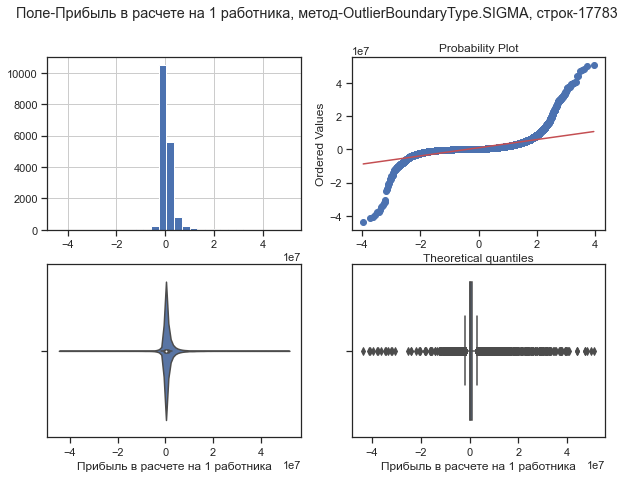

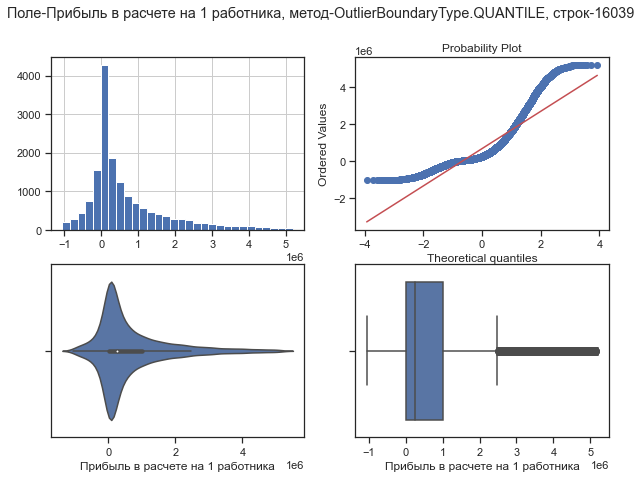

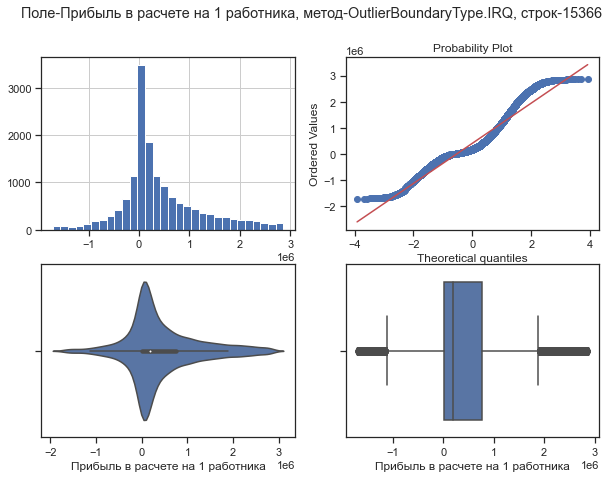

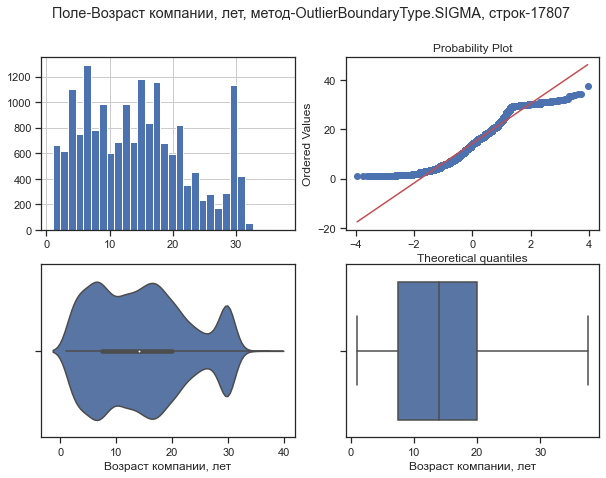

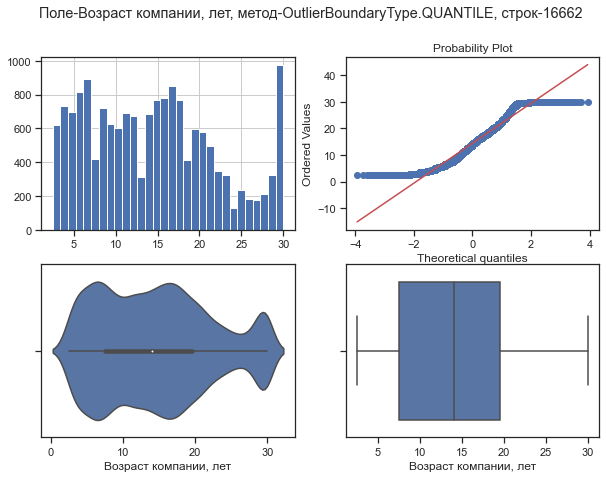

...

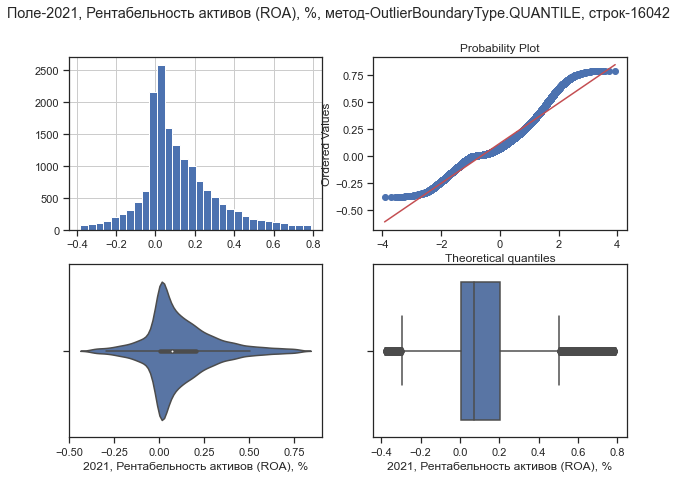

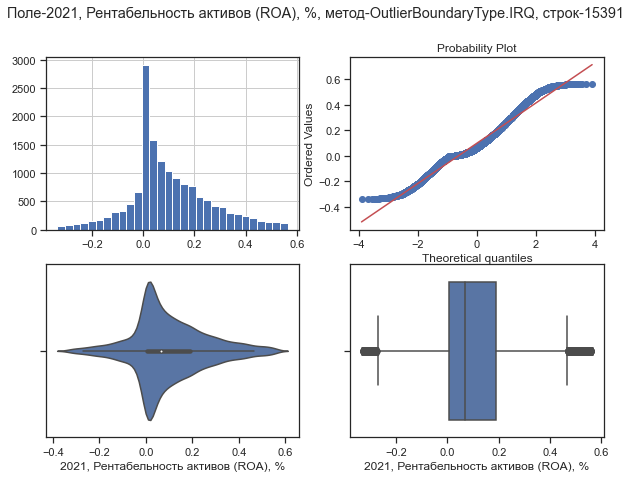

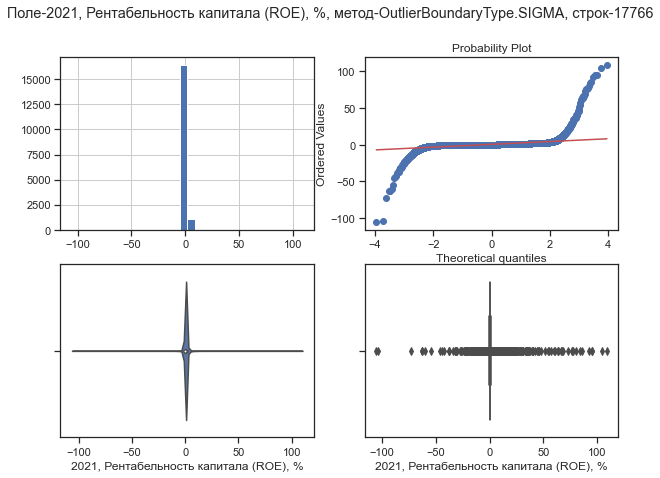

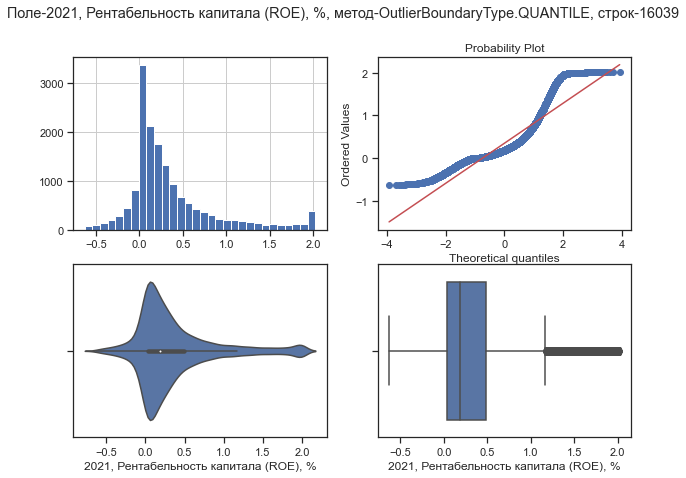

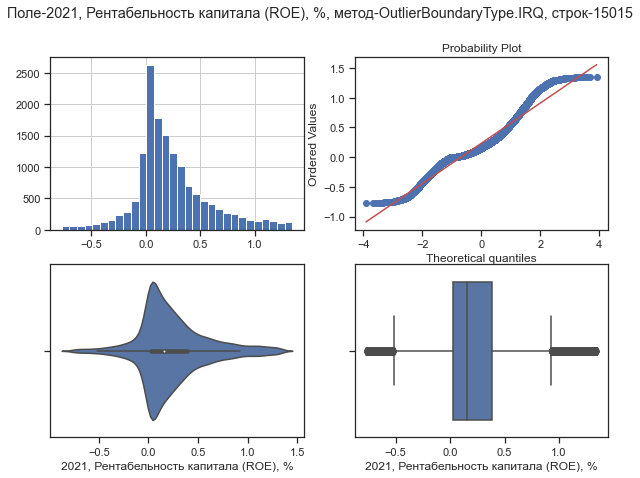

In [31]:
data_all.shape
for col in data_all.columns:    
    for obt in OutlierBoundaryType:
        # Вычисление верхней и нижней границы
        lower_boundary, upper_boundary = get_outlier_boundaries(data_all, col, obt)
        # Флаги для удаления выбросов
        outliers_temp = np.where(data_all[col] > upper_boundary, True, 
                                 np.where(data_all[col] < lower_boundary, True, False))
        # Удаление данных на основе флага
        data_trimmed = data_all.loc[~(outliers_temp), ]  
        title = 'Поле-{}, метод-{}, строк-{}'.format(col, obt, data_trimmed.shape[0])
        diagnostic_plots(data_trimmed, col, title)


In [32]:
data_trimmed

,Прибыль в расчете на 1 работника,"Возраст компании, лет",Оборотный капитал на 1 работника,Чистые активы на 1 работника,Совокупный долг на 1 работника,Налоговая нагрузка,Выручка на 1 рубль активов,Налоги на 1 работника,Кредиторская задолженность на 1 работника,НАлоги на 1 руб себестоимости,...,"2021, Доля рабочего капитала в активах компании, %","2021, Коэффициент оборачиваемости совокупных активов, %","2021, Соотношение чистого долга к капиталу, %","2021, Коэффициент концентрации собственного капитала (автономии), %","2021, Коэффициент маневренности собственных средств, %","2021, Коэффициент обеспеченности собственными оборотными средствами, %","2021, Рентабельность затрат, %","2021, Доля себестоимости как процент от выручки, %","2021, Рентабельность активов (ROA), %","2021, Рентабельность капитала (ROE), %"
0,7.700000e+04,4.5,4.585000e+06,1.000000e+04,7.091000e+06,0.174699,0.219265,272007.000000,2.516000e+06,0.183789,...,0.3768,0.3088,457.2000,0.0014,1.0000,0.0014,0.0520,0.9505,0.0014,0.7000
1,-2.612500e+05,2.5,2.667500e+05,7.007500e+05,2.137000e+06,0.040449,0.641001,73576.000000,4.970000e+05,0.035369,...,-0.4371,0.6926,2.3403,0.2469,-1.7702,-1.3837,-0.1256,1.1436,-0.0273,-0.1079
2,5.550000e+04,20.5,4.197500e+05,4.197500e+05,2.202500e+05,0.096504,1.576953,97397.000000,2.202500e+05,0.102120,...,0.6559,1.5453,-0.1668,0.6559,1.0000,0.6559,0.0582,0.9450,0.0031,0.0048
3,1.456538e+06,7.5,1.119769e+06,2.005769e+06,3.150077e+06,0.027554,1.092621,155220.846154,2.267923e+06,0.037162,...,0.2172,1.4180,0.0098,0.3890,0.1185,0.0701,0.3487,0.7414,0.2698,0.6934
5,-2.570000e+05,17.5,-2.317000e+06,-5.690000e+05,3.380000e+06,0.456800,0.090715,116484.000000,2.340000e+06,0.227508,...,-1.1942,0.0825,-1.7909,-0.2024,5.9016,-146.0000,-0.5020,2.0078,-0.0961,0.7063
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19995,1.198224e+06,14.5,4.291574e+06,8.082203e+06,1.412344e+06,0.108466,0.337654,347564.847059,3.133647e+05,0.213081,...,0.4278,0.3614,0.1292,0.8516,0.4886,0.7374,0.5973,0.5090,0.0825,0.1016
19996,2.217896e+06,14.5,2.871264e+06,4.306684e+06,2.738549e+06,0.056203,0.641221,253901.149306,1.051132e+06,0.130892,...,0.2629,0.6418,0.3517,0.6113,0.3000,0.3205,0.9644,0.4294,0.3052,0.5163
19997,4.881389e+06,17.0,2.315937e+06,4.420152e+06,7.053322e+06,0.054655,0.771070,483523.314815,1.241811e+06,0.126271,...,0.1927,0.6980,1.3042,0.3852,-0.6856,-0.7533,1.2310,0.4328,0.3836,0.8179
19998,9.151083e+06,5.0,1.082633e+07,1.673125e+07,1.149425e+07,0.007274,0.541579,111197.250000,7.850000e+04,0.018357,...,0.3030,0.6844,0.5692,0.5928,-0.0217,-0.0326,1.4916,0.3963,0.3901,0.6717


C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


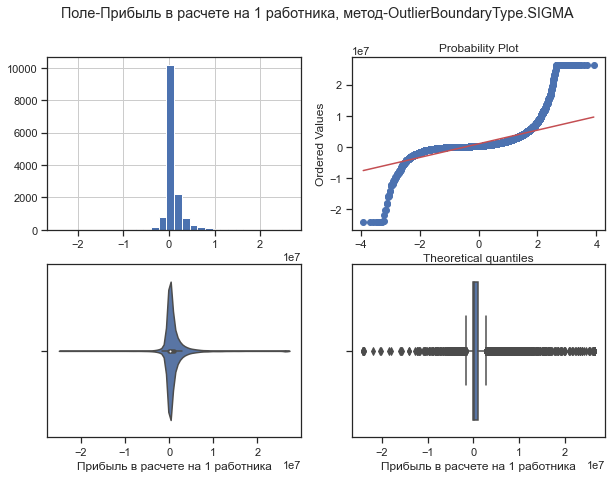

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


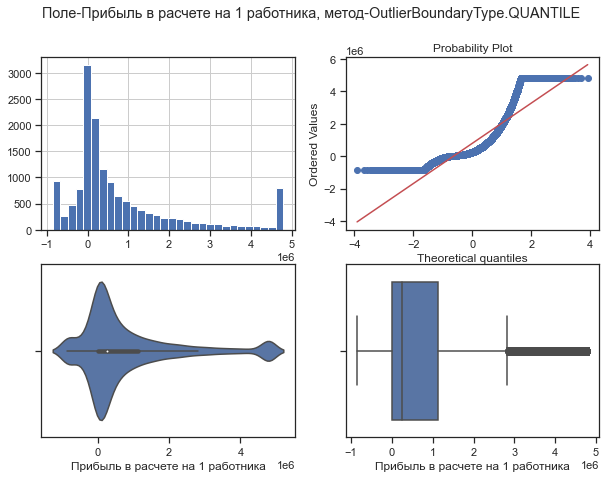

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


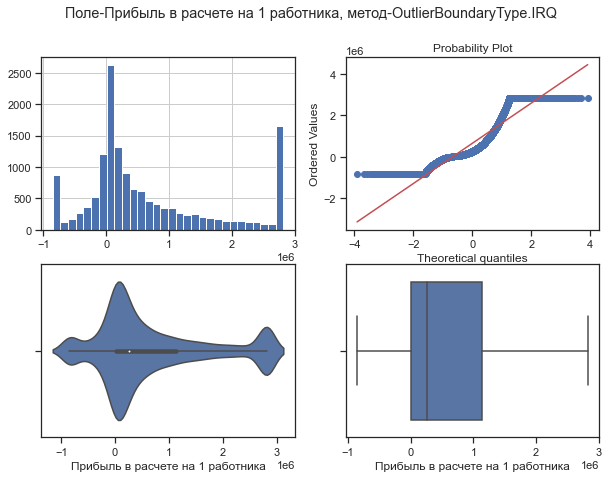

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


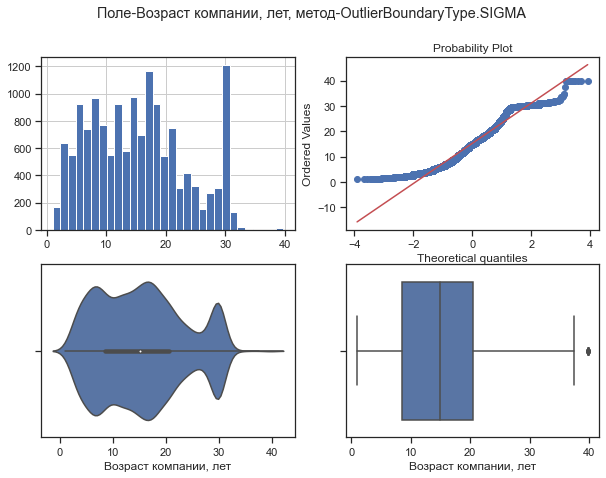

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


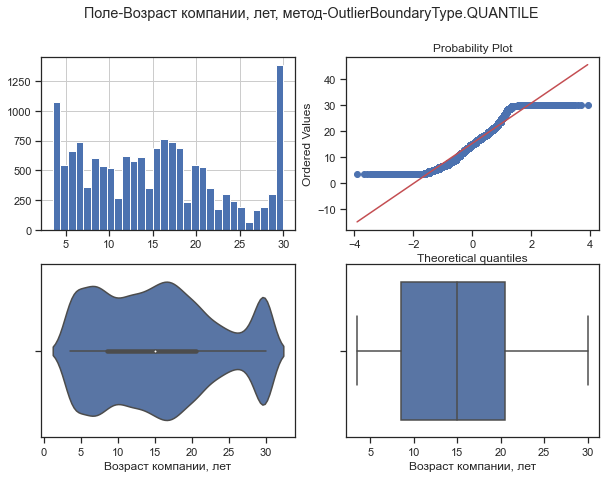

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


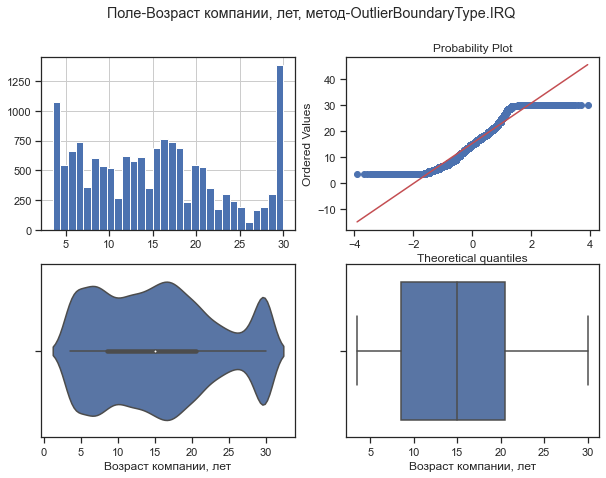

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


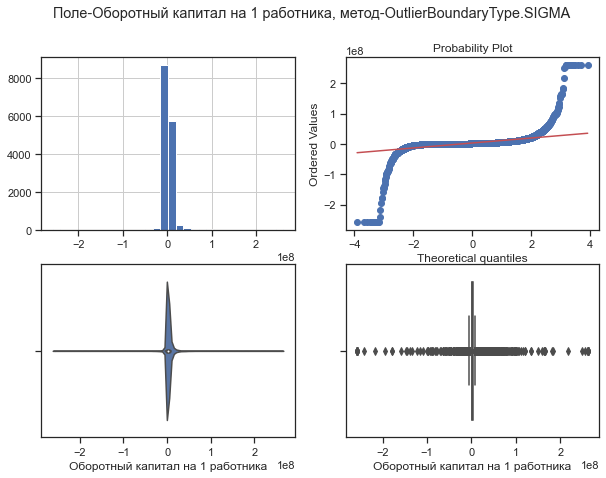

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


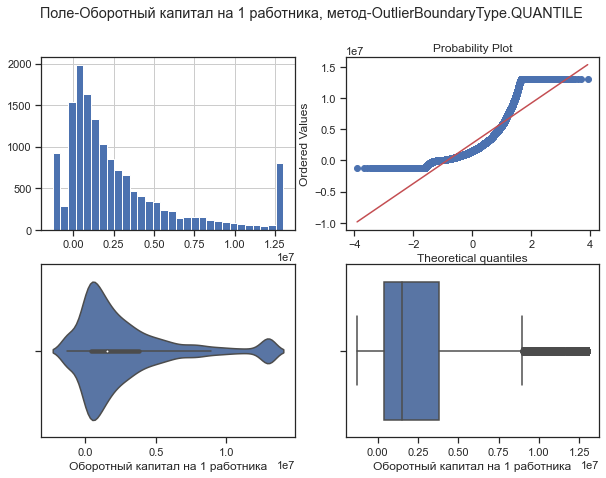

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


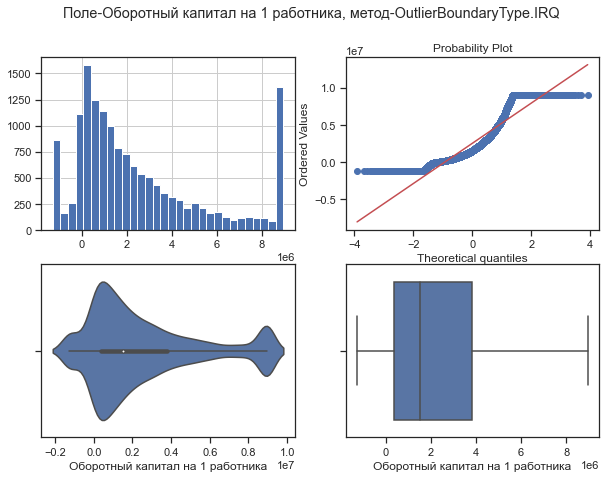

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


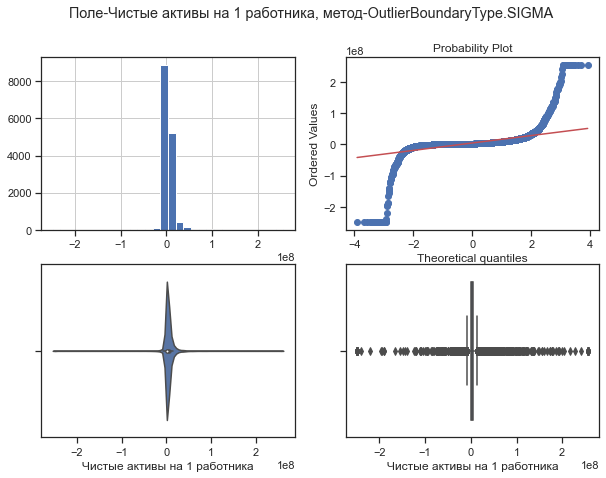

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


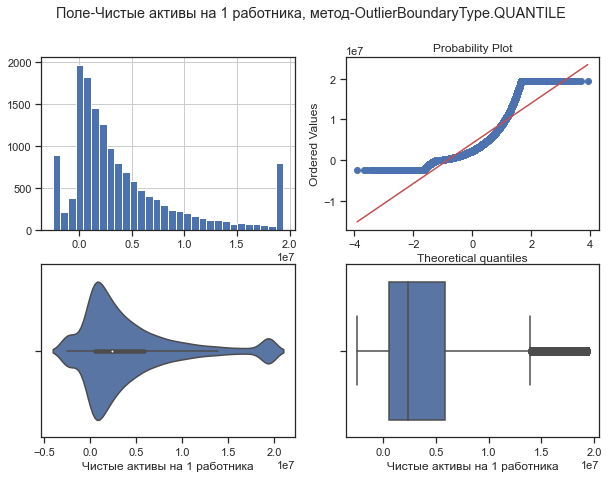

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


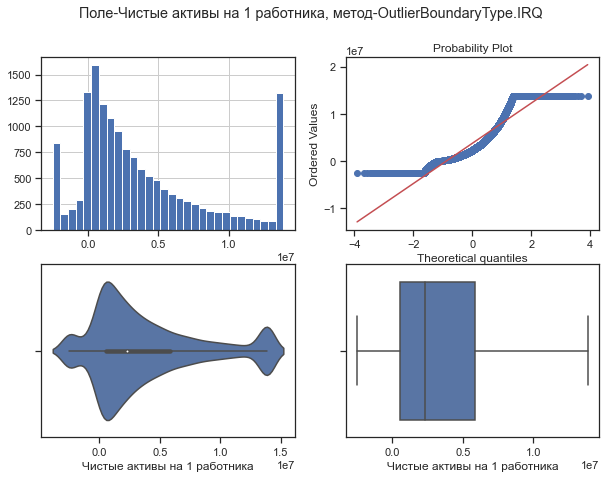

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


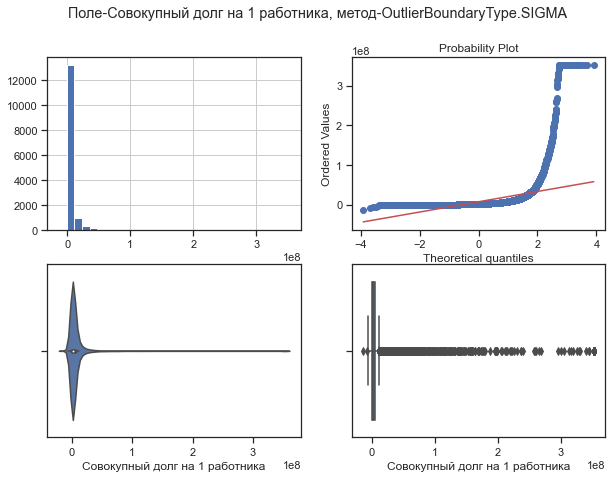

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


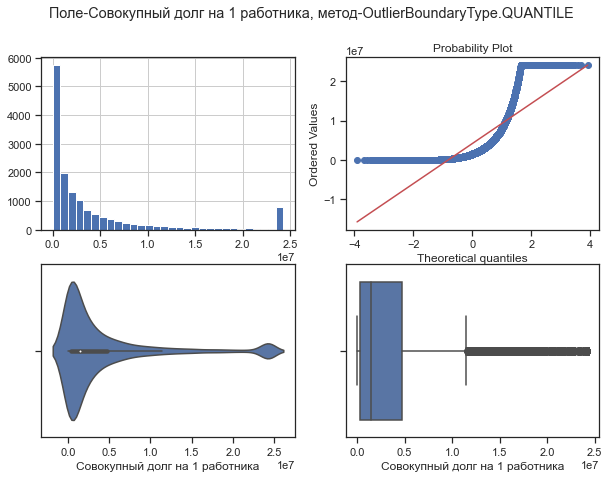

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


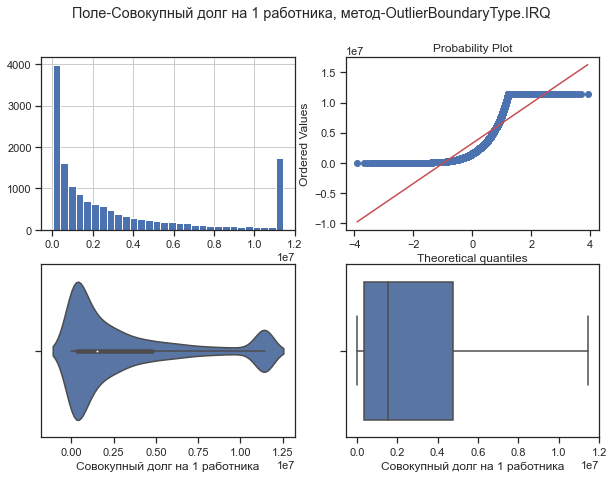

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


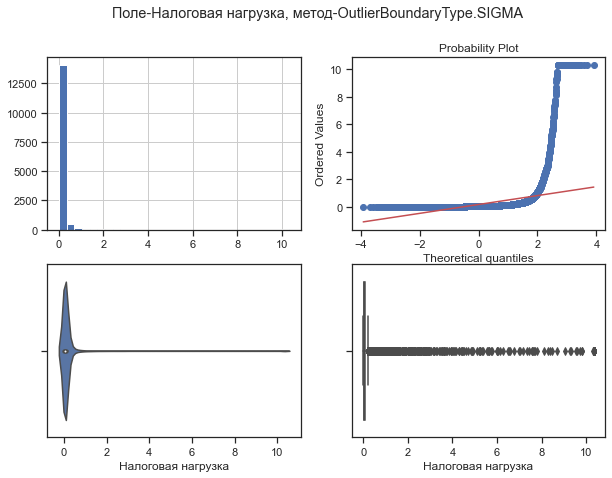

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


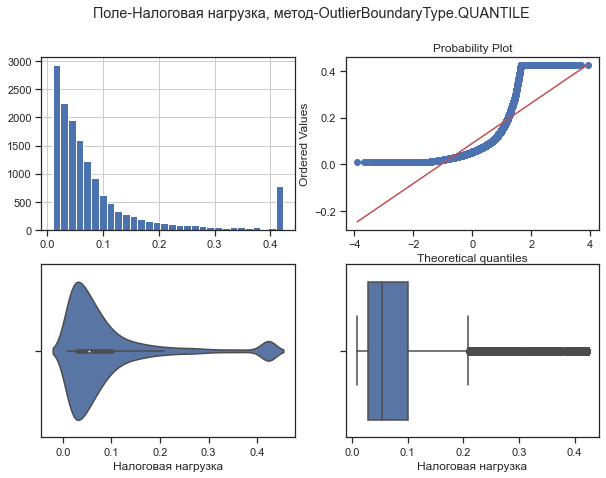

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


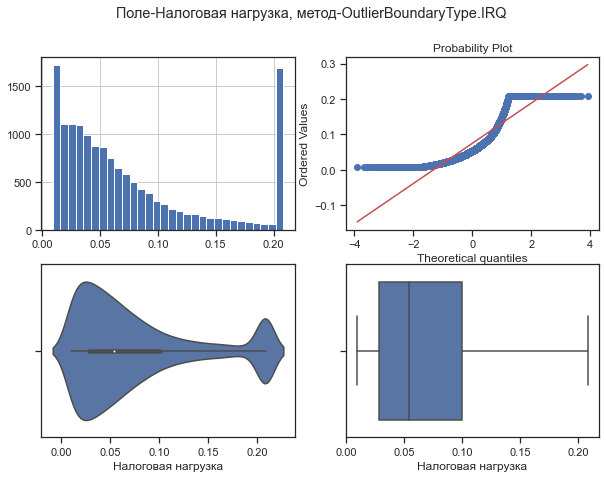

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


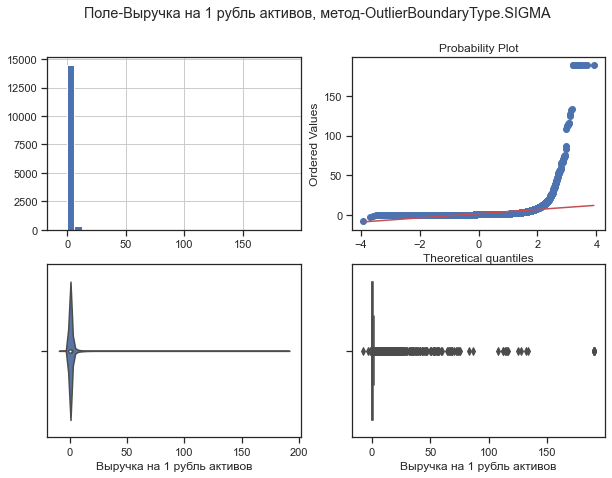

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


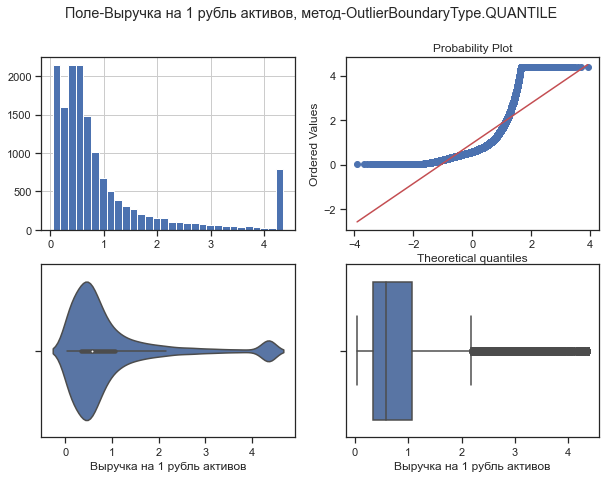

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


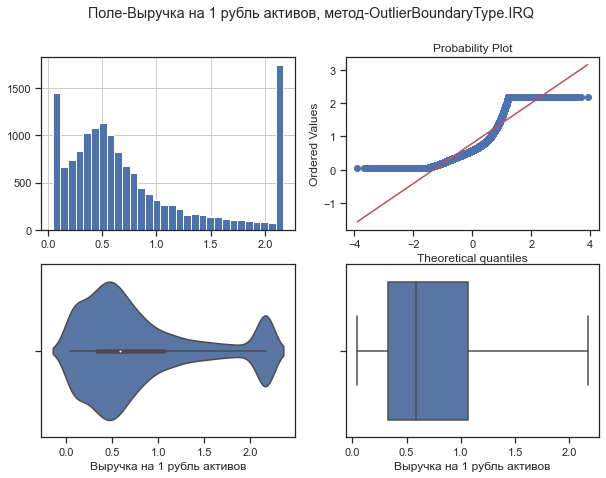

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


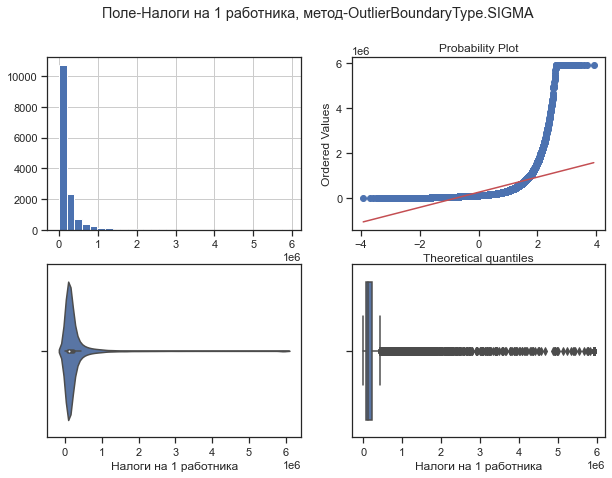

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


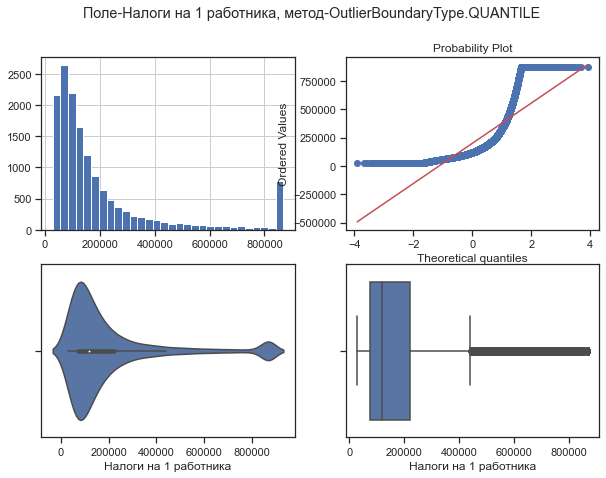

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


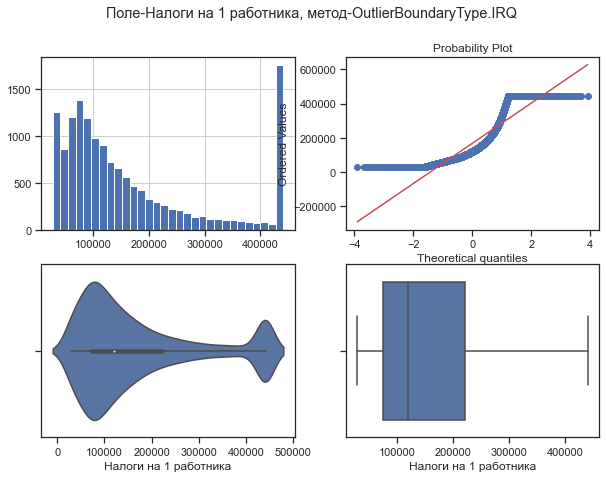

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


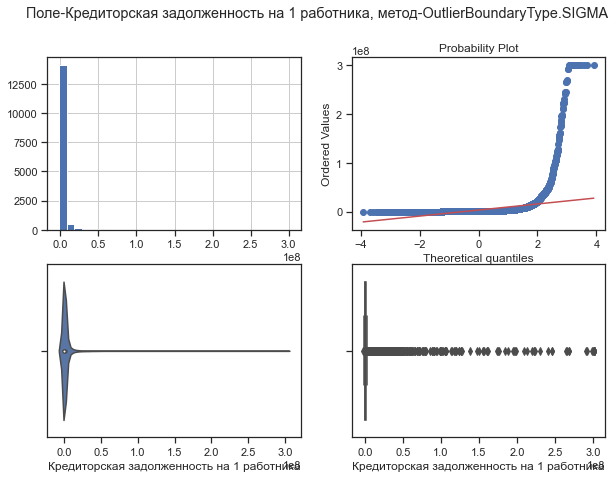

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


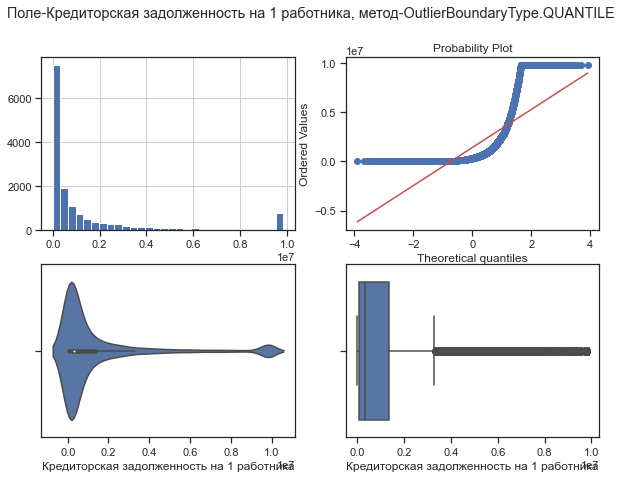

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


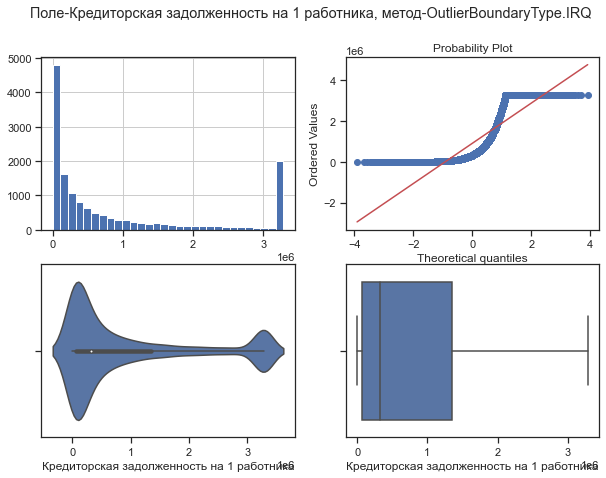

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


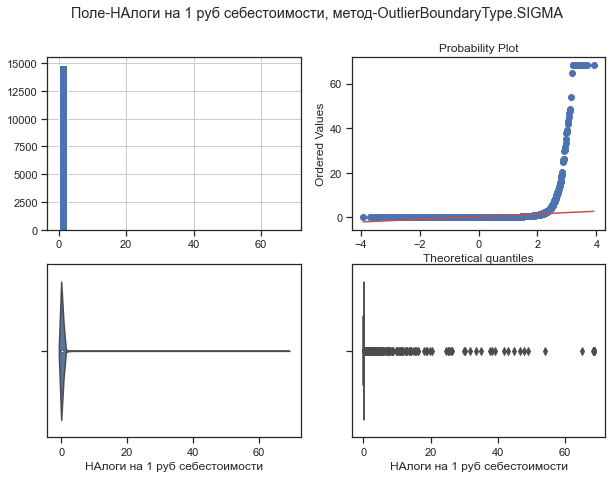

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


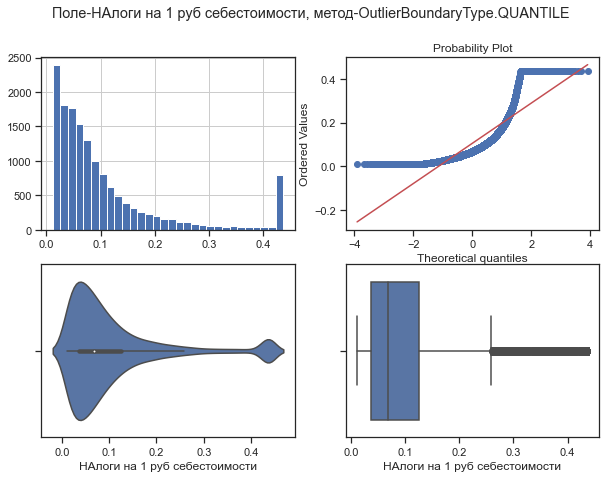

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


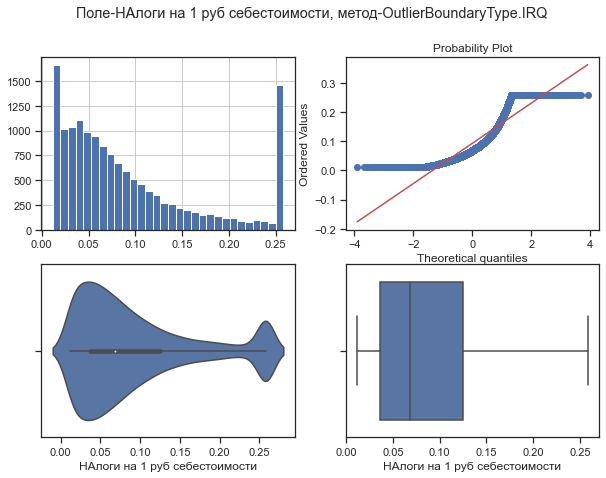

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


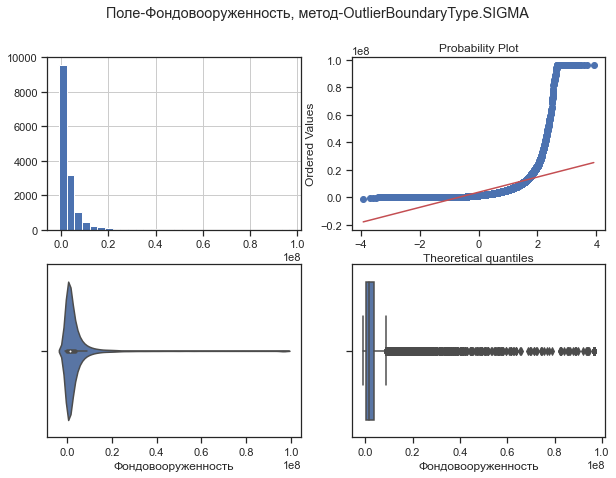

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


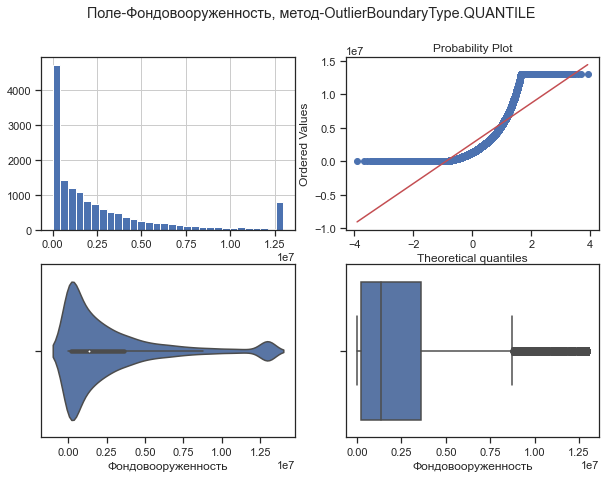

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


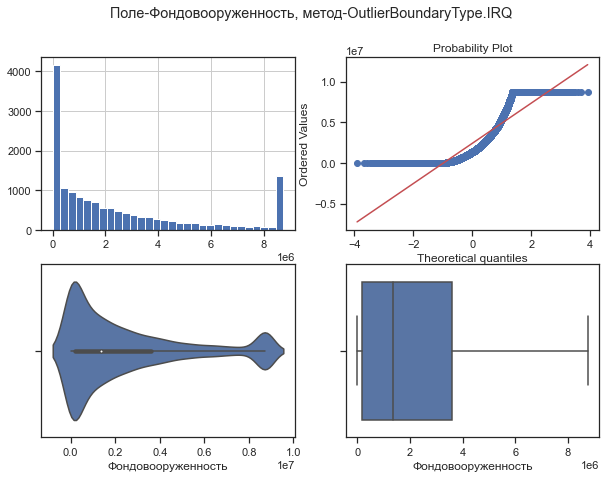

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


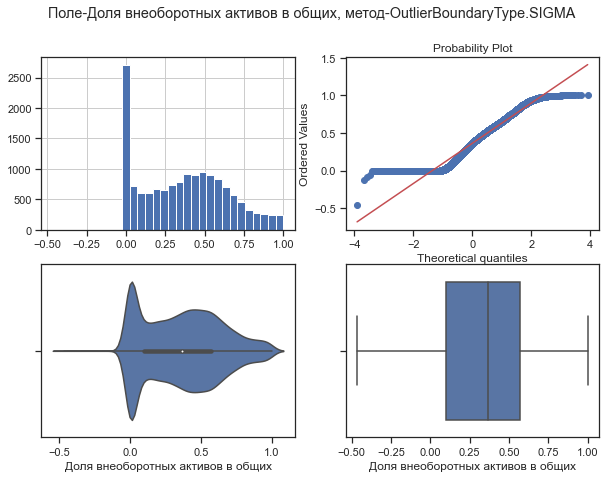

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


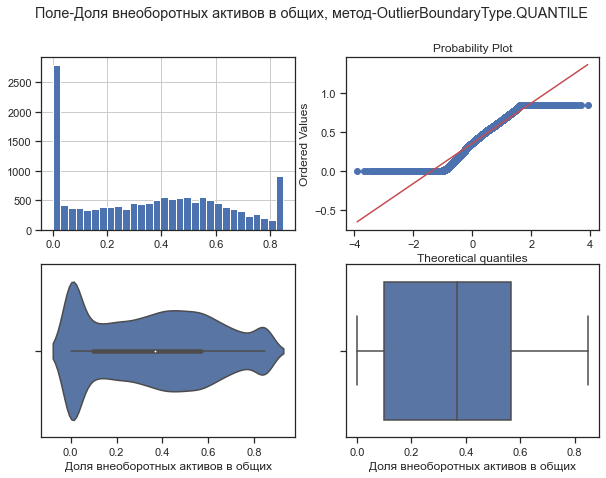

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


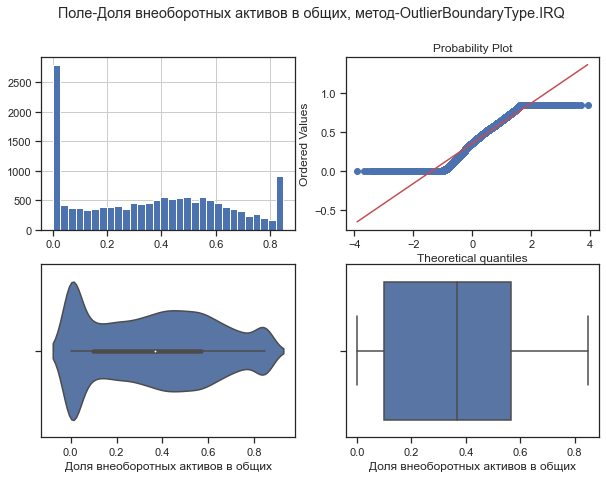

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


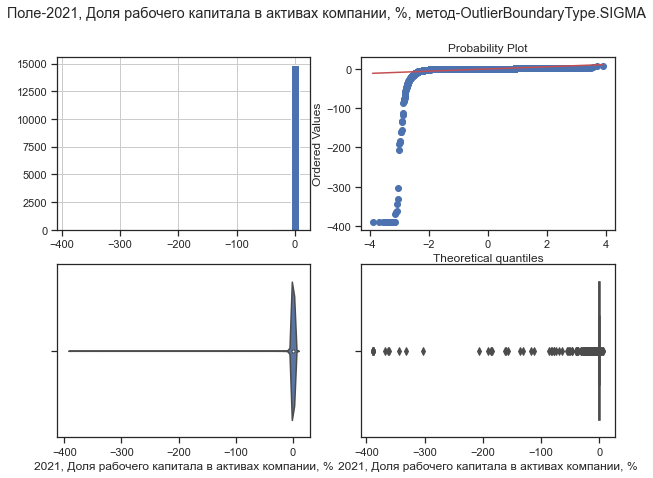

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


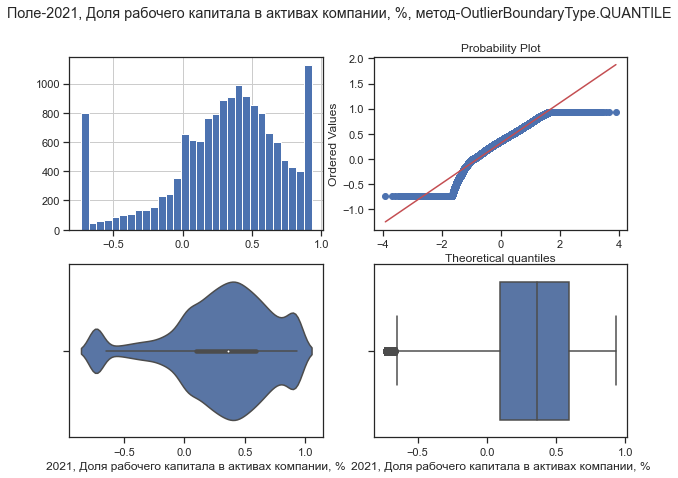

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


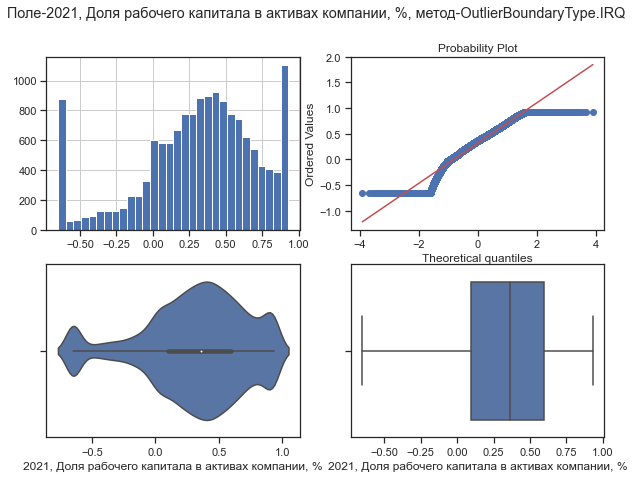

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


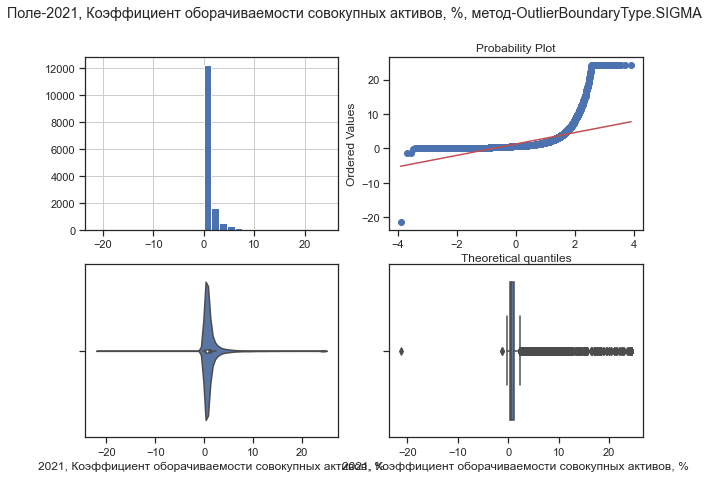

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


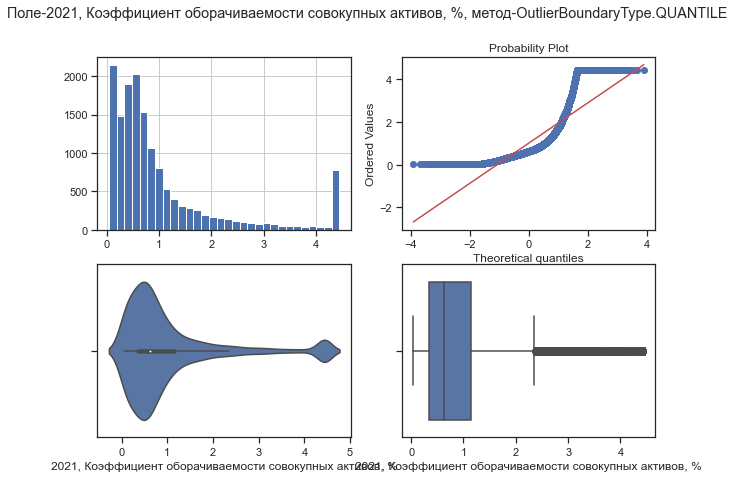

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


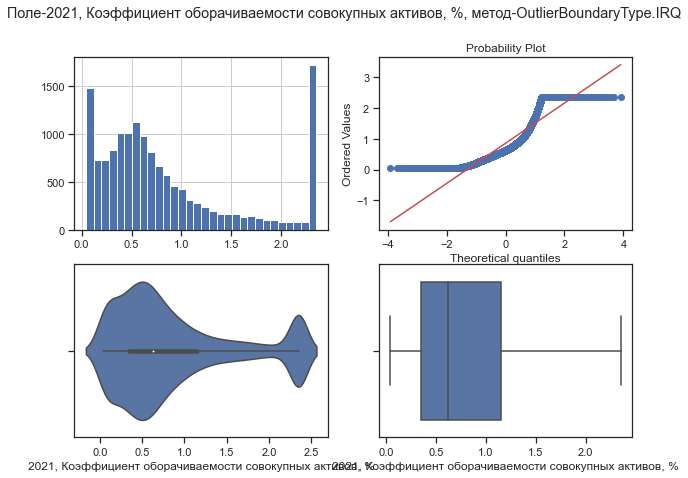

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


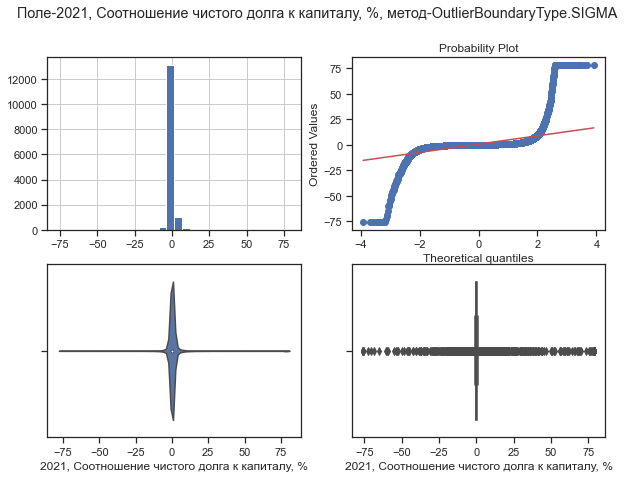

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


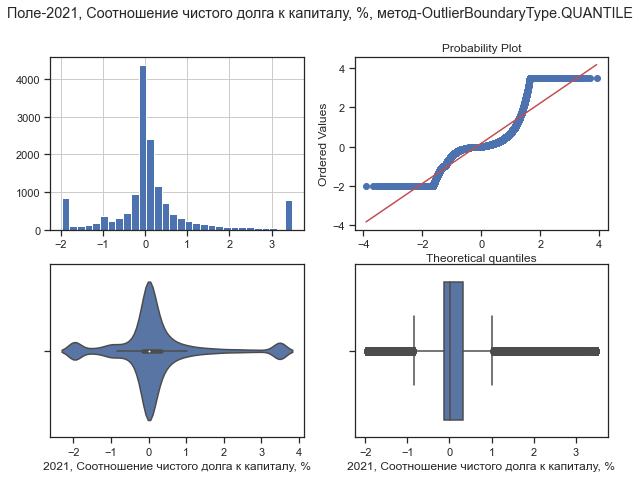

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


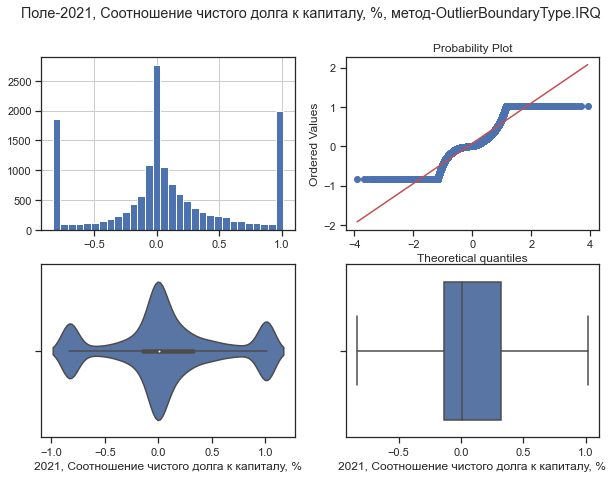

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


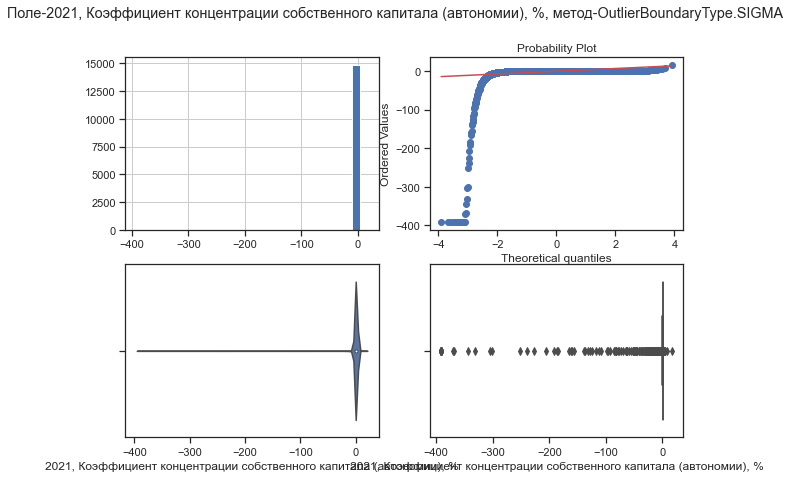

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


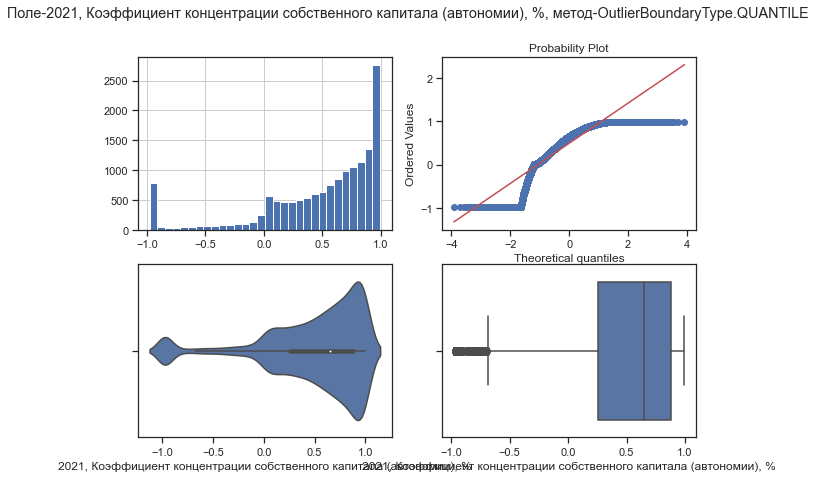

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


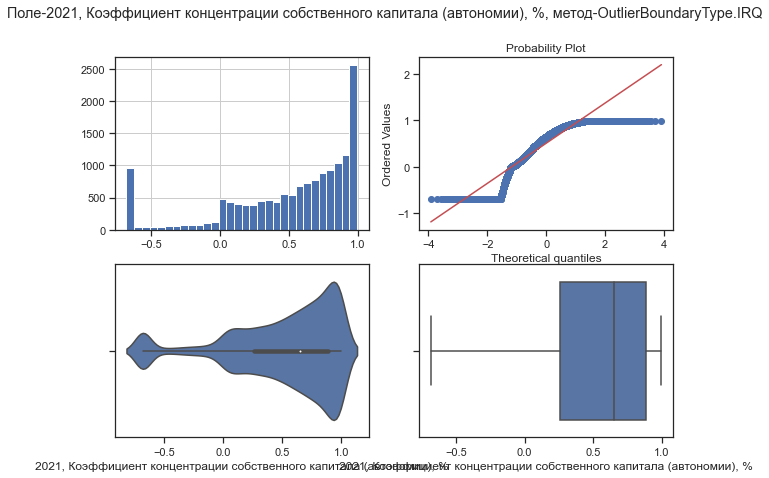

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


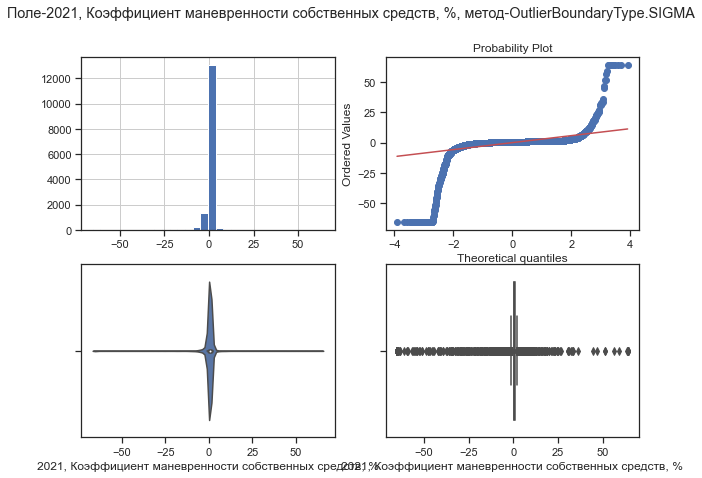

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


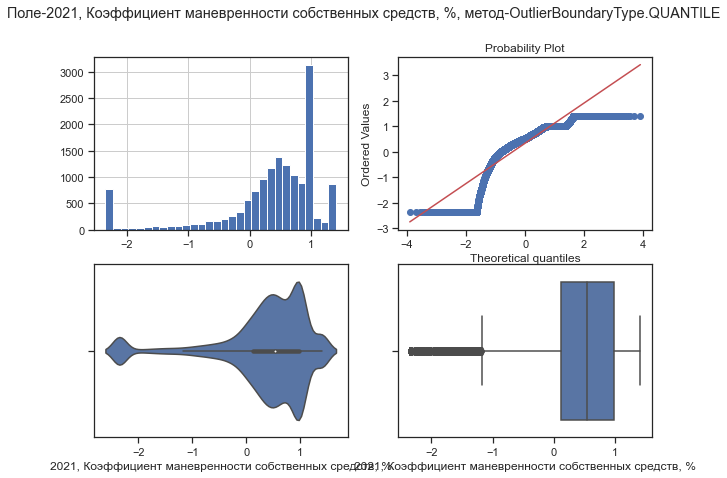

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


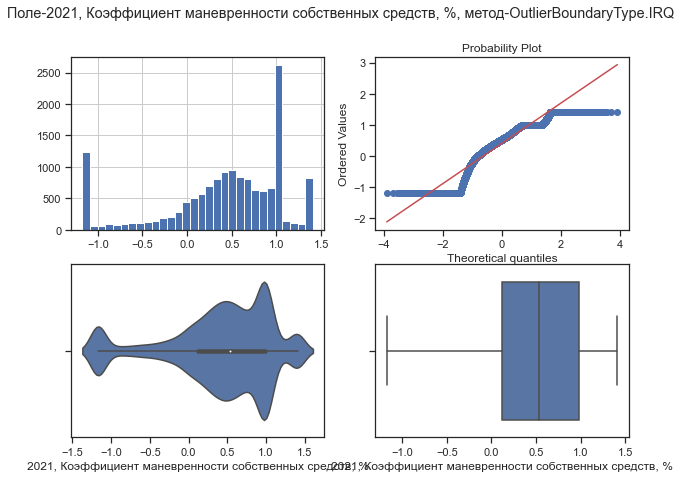

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


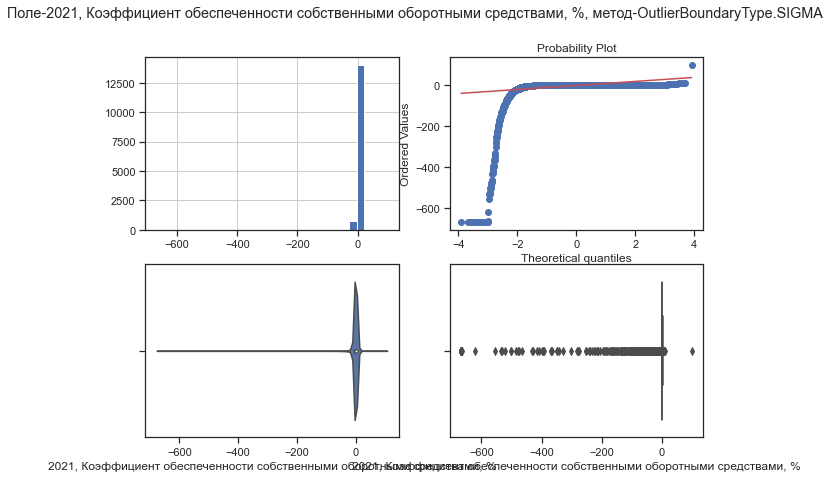

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


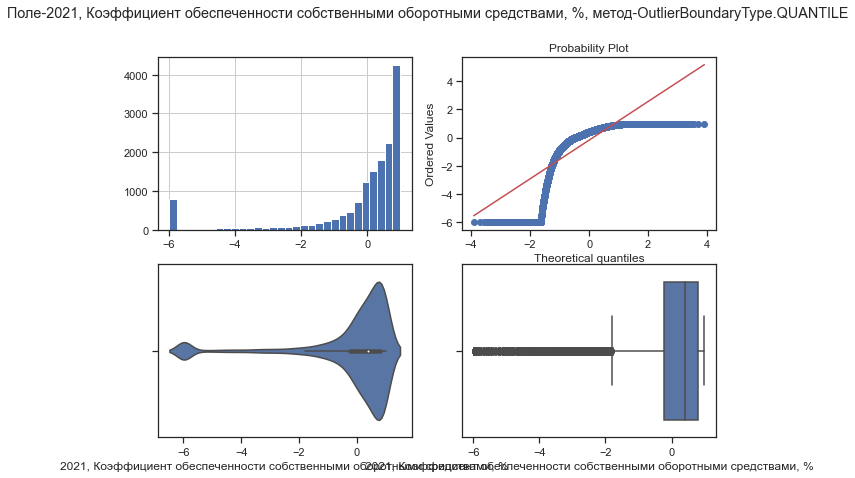

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


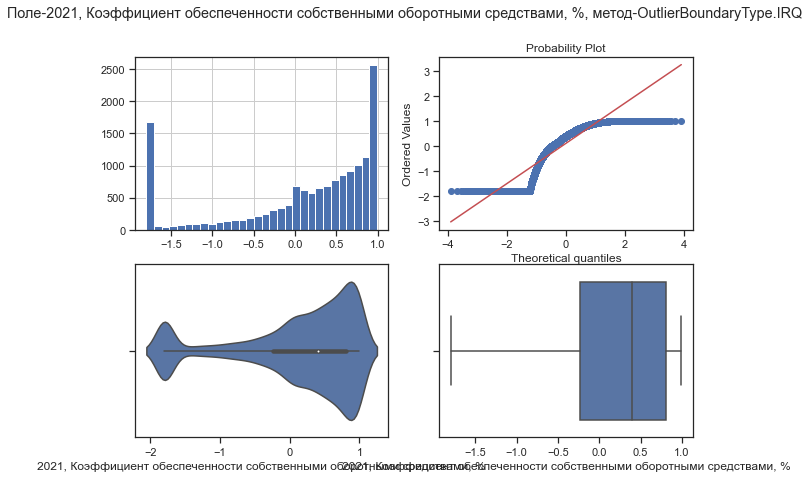

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


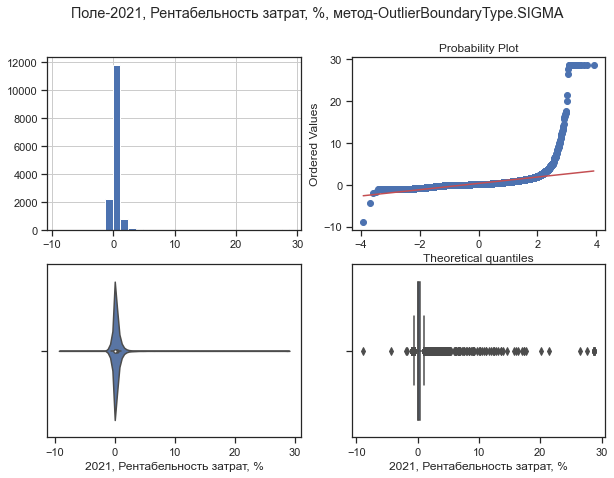

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


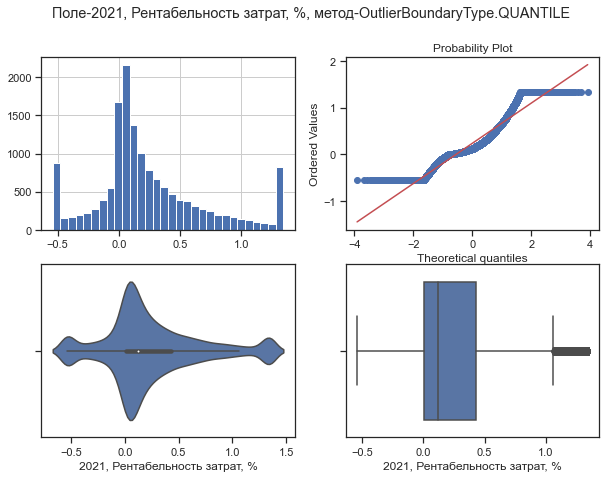

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


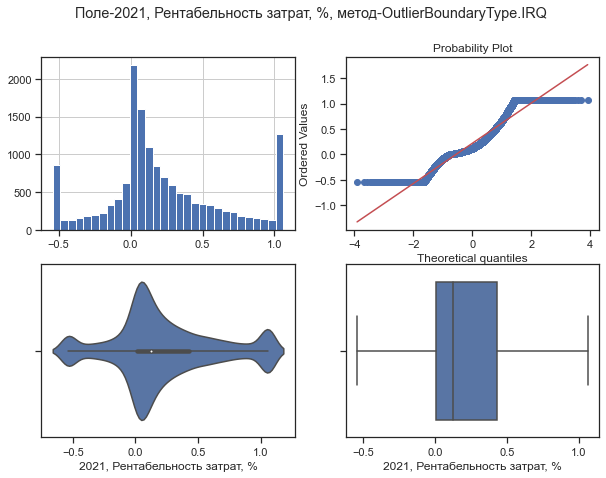

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


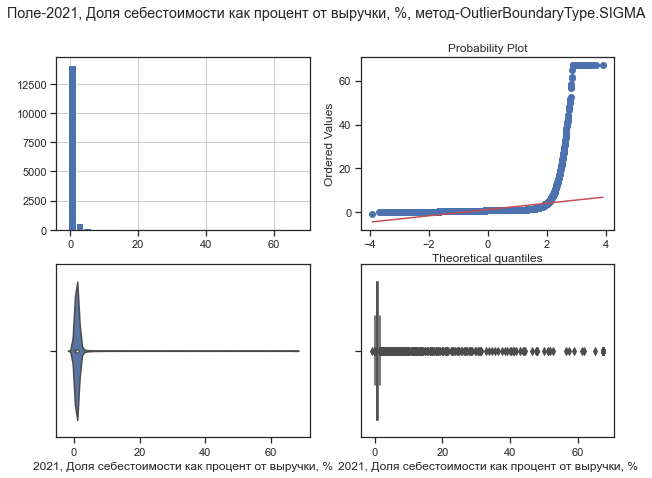

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


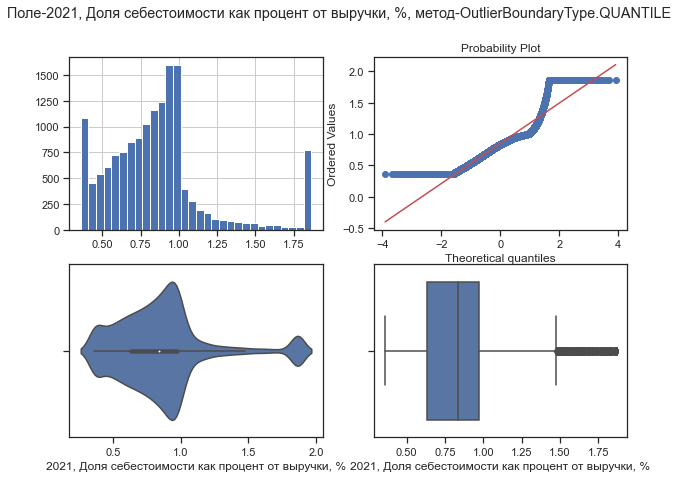

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


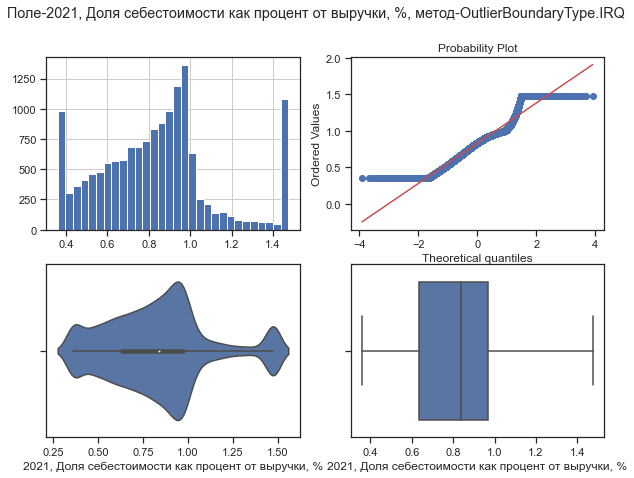

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


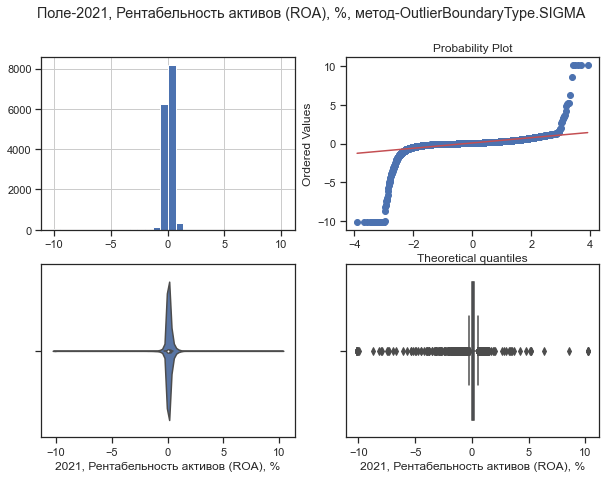

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


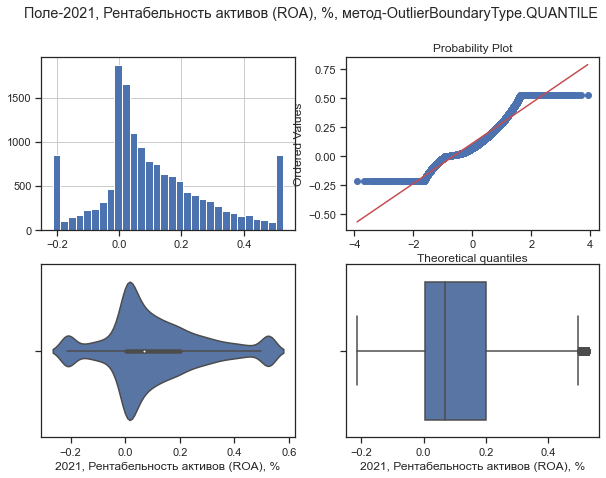

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


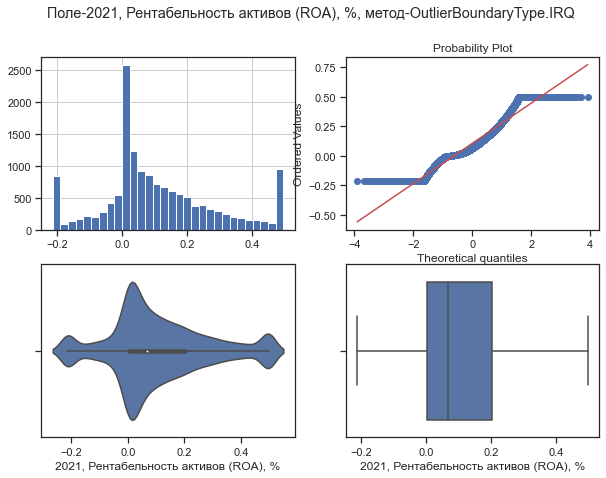

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


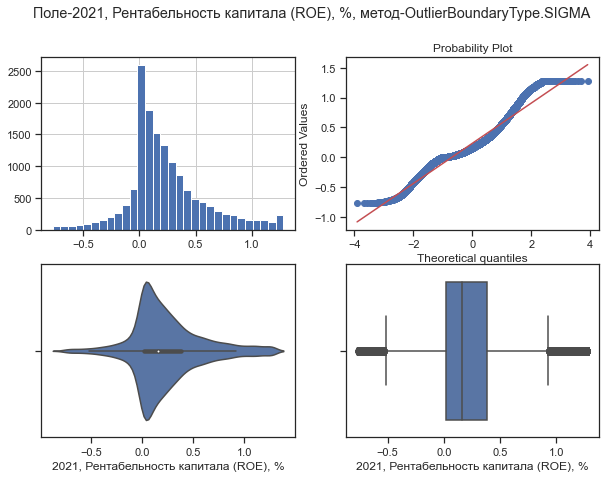

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


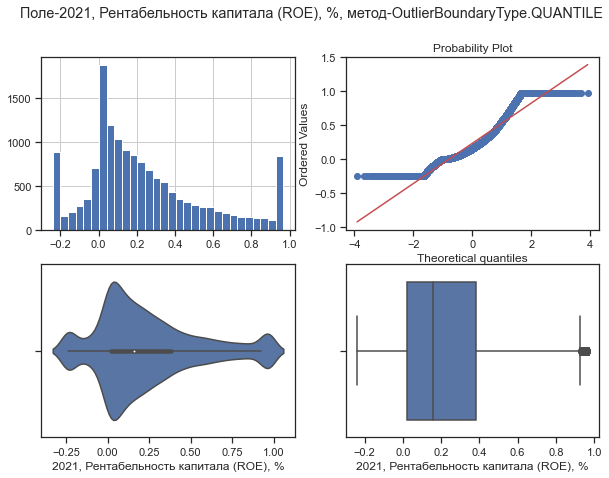

C:\Users\user\AppData\Local\Temp\ipykernel_8304\1250755308.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary,


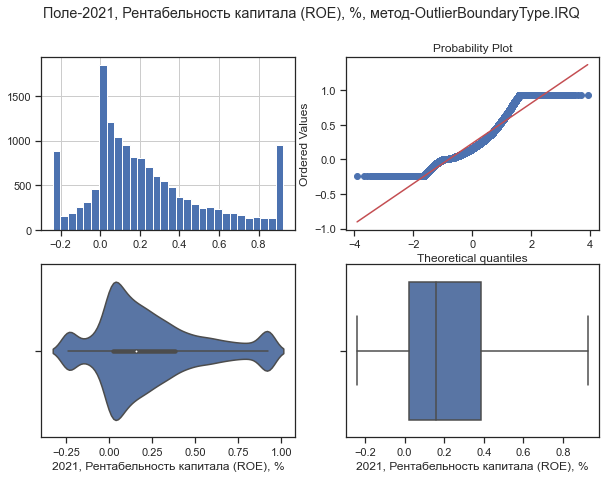

In [33]:
for col in data_trimmed.columns:    
    for obt in OutlierBoundaryType:
        # Вычисление верхней и нижней границы
        lower_boundary, upper_boundary = get_outlier_boundaries(data_trimmed, col, obt)
        # Изменение данных
        data_trimmed[col] = np.where(data_trimmed[col] > upper_boundary, upper_boundary, 
                                 np.where(data_trimmed[col] < lower_boundary, lower_boundary, data_trimmed[col]))
        title = 'Поле-{}, метод-{}'.format(col, obt)
        diagnostic_plots(data_trimmed, col, title)

## Подбор факторов

In [34]:
data_trimmed.corr(method='pearson')

,Прибыль в расчете на 1 работника,"Возраст компании, лет",Оборотный капитал на 1 работника,Чистые активы на 1 работника,Совокупный долг на 1 работника,Налоговая нагрузка,Выручка на 1 рубль активов,Налоги на 1 работника,Кредиторская задолженность на 1 работника,НАлоги на 1 руб себестоимости,...,"2021, Доля рабочего капитала в активах компании, %","2021, Коэффициент оборачиваемости совокупных активов, %","2021, Соотношение чистого долга к капиталу, %","2021, Коэффициент концентрации собственного капитала (автономии), %","2021, Коэффициент маневренности собственных средств, %","2021, Коэффициент обеспеченности собственными оборотными средствами, %","2021, Рентабельность затрат, %","2021, Доля себестоимости как процент от выручки, %","2021, Рентабельность активов (ROA), %","2021, Рентабельность капитала (ROE), %"
Прибыль в расчете на 1 работника,1.000000,0.008366,0.515353,0.583247,0.089611,-0.397130,0.040920,0.348616,0.095723,-0.112279,...,0.239356,0.093802,0.085389,0.293201,-0.010086,0.276844,0.775976,-0.688121,0.628341,0.416871
"Возраст компании, лет",0.008366,1.000000,0.008111,0.095012,-0.207461,0.067681,-0.124891,-0.007019,-0.212286,0.088959,...,0.086586,-0.143879,-0.003298,0.240031,-0.006805,0.168188,0.060288,-0.056406,0.004996,-0.176629
Оборотный капитал на 1 работника,0.515353,0.008111,1.000000,0.710247,0.243544,-0.211459,-0.271787,0.293882,0.073576,-0.091639,...,0.415324,-0.240064,0.140745,0.272845,0.097829,0.322176,0.353940,-0.298764,0.207498,0.063746
Чистые активы на 1 работника,0.583247,0.095012,0.710247,1.000000,0.105535,-0.209855,-0.301819,0.330253,0.101834,-0.060801,...,0.291292,-0.269225,0.176972,0.508410,-0.110946,0.372335,0.416772,-0.368188,0.261633,0.021673
Совокупный долг на 1 работника,0.089611,-0.207461,0.243544,0.105535,1.000000,-0.006553,-0.292720,0.324301,0.692737,-0.050126,...,-0.389729,-0.273882,0.157637,-0.530339,-0.195426,-0.533300,-0.100567,0.071816,-0.212331,0.051752
Налоговая нагрузка,-0.397130,0.067681,-0.211459,-0.209855,-0.006553,1.000000,-0.204451,0.172819,-0.051318,0.833792,...,-0.166949,-0.243818,-0.163913,-0.213033,0.100540,-0.219363,-0.336370,0.319477,-0.338558,-0.222897
Выручка на 1 рубль активов,0.040920,-0.124891,-0.271787,-0.301819,-0.292720,-0.204451,1.000000,0.067146,-0.113695,-0.184696,...,0.081084,0.965284,-0.201756,-0.020531,0.179099,0.105461,-0.032357,0.004827,0.263558,0.257143
Налоги на 1 работника,0.348616,-0.007019,0.293882,0.330253,0.324301,0.172819,0.067146,1.000000,0.355023,0.285356,...,-0.011187,0.067137,0.013146,-0.003112,-0.023647,0.000388,0.133097,-0.166909,0.107312,0.120809
Кредиторская задолженность на 1 работника,0.095723,-0.212286,0.073576,0.101834,0.692737,-0.051318,-0.113695,0.355023,1.000000,-0.062299,...,-0.364571,-0.092473,0.057863,-0.391975,-0.098617,-0.305444,-0.074812,0.035783,-0.143443,0.071850
НАлоги на 1 руб себестоимости,-0.112279,0.088959,-0.091639,-0.060801,-0.050126,0.833792,-0.184696,0.285356,-0.062299,1.000000,...,-0.051937,-0.207806,-0.117355,-0.070987,0.089515,-0.081339,0.052393,-0.123610,-0.074305,-0.100315


<AxesSubplot:>

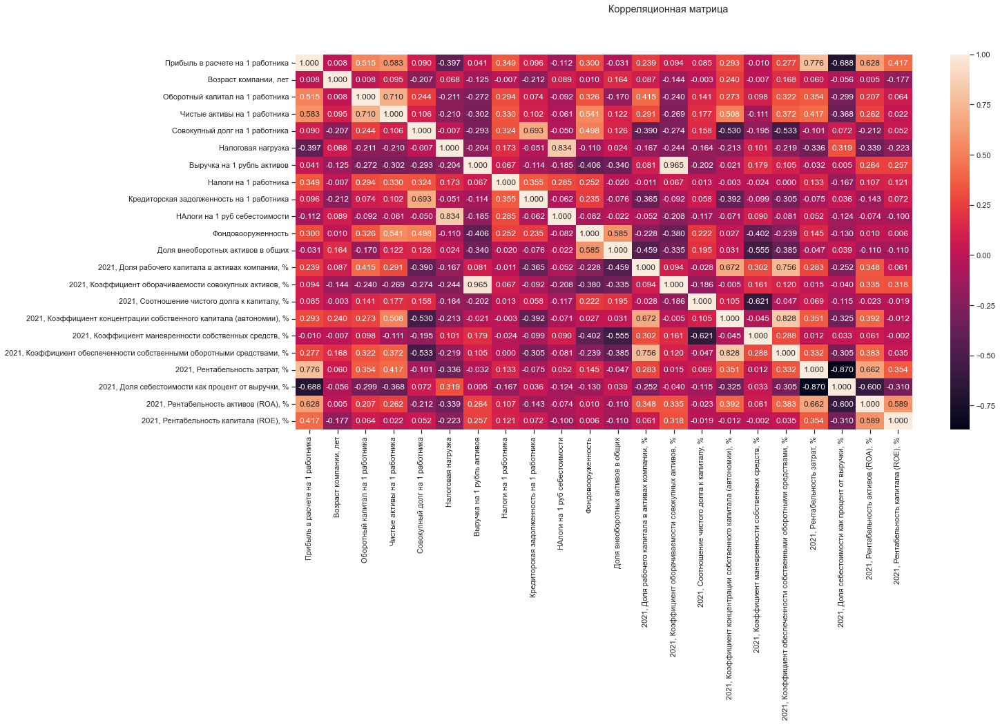

In [35]:
fig, ax = plt.subplots(1, 1, sharex='col', sharey='row', figsize=(20,10))
fig.suptitle('Корреляционная матрица')
sns.heatmap(data_trimmed.corr(), ax=ax, annot=True, fmt='.3f')

In [36]:
# Выберем список относительных показателей, которые нам понадобятся для построения модели для проверки выбросов
x_col_list3 = ['Прибыль в расчете на 1 работника', 'Возраст компании, лет','Чистые активы на 1 работника', 'Налоговая нагрузка', 'Налоги на 1 работника','Кредиторская задолженность на 1 работника', 'Фондовооруженность','Доля внеоборотных активов в общих', '2021, Коэффициент оборачиваемости совокупных активов, %', '2021, Соотношение чистого долга к капиталу, %', '2021, Коэффициент концентрации собственного капитала (автономии), %', '2021, Коэффициент маневренности собственных средств, %', '2021, Доля себестоимости как процент от выручки, %']
data_all2=data_trimmed[x_col_list3]
data_all2.head()

,Прибыль в расчете на 1 работника,"Возраст компании, лет",Чистые активы на 1 работника,Налоговая нагрузка,Налоги на 1 работника,Кредиторская задолженность на 1 работника,Фондовооруженность,Доля внеоборотных активов в общих,"2021, Коэффициент оборачиваемости совокупных активов, %","2021, Соотношение чистого долга к капиталу, %","2021, Коэффициент концентрации собственного капитала (автономии), %","2021, Коэффициент маневренности собственных средств, %","2021, Доля себестоимости как процент от выручки, %"
0,7.700000e+04,4.5,1.000000e+04,0.174699,272007.000000,2.516000e+06,0.000000e+00,0.000000,0.3088,1.01425,0.0014,1.00000,0.9505
1,-2.612500e+05,3.5,7.007500e+05,0.040449,73576.000000,4.970000e+05,1.941250e+06,0.684081,0.6926,1.01425,0.2469,-1.17360,1.1436
2,5.550000e+04,20.5,4.197500e+05,0.096504,97397.000000,2.202500e+05,0.000000e+00,0.000000,1.5453,-0.16680,0.6559,1.00000,0.9450
3,1.456538e+06,7.5,2.005769e+06,0.027554,155220.846154,2.267923e+06,1.767154e+06,0.342942,1.4180,0.00980,0.3890,0.11850,0.7414
5,-2.570000e+05,17.5,-5.690000e+05,0.208271,116484.000000,2.340000e+06,2.787000e+06,0.848371,0.0825,-0.83215,-0.2024,1.40911,1.4744


<AxesSubplot:>

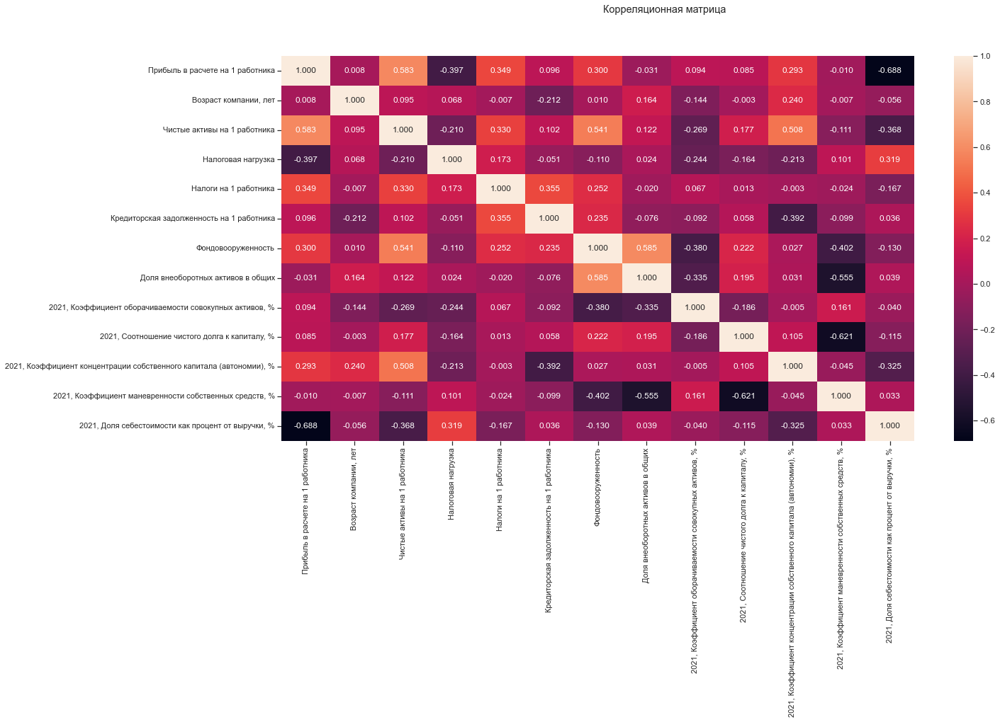

In [37]:
fig, ax = plt.subplots(1, 1, sharex='col', sharey='row', figsize=(20,10))
fig.suptitle('Корреляционная матрица')
sns.heatmap(data_all2.corr(), ax=ax, annot=True, fmt='.3f')

## Предварительный анализ данных

C:\Users\user\anaconda3\lib\site-packages\seaborn\axisgrid.py:88: UserWarning: Tight layout not applied. tight_layout cannot make axes width small enough to accommodate all axes decorations
  self._figure.tight_layout(*args, **kwargs)


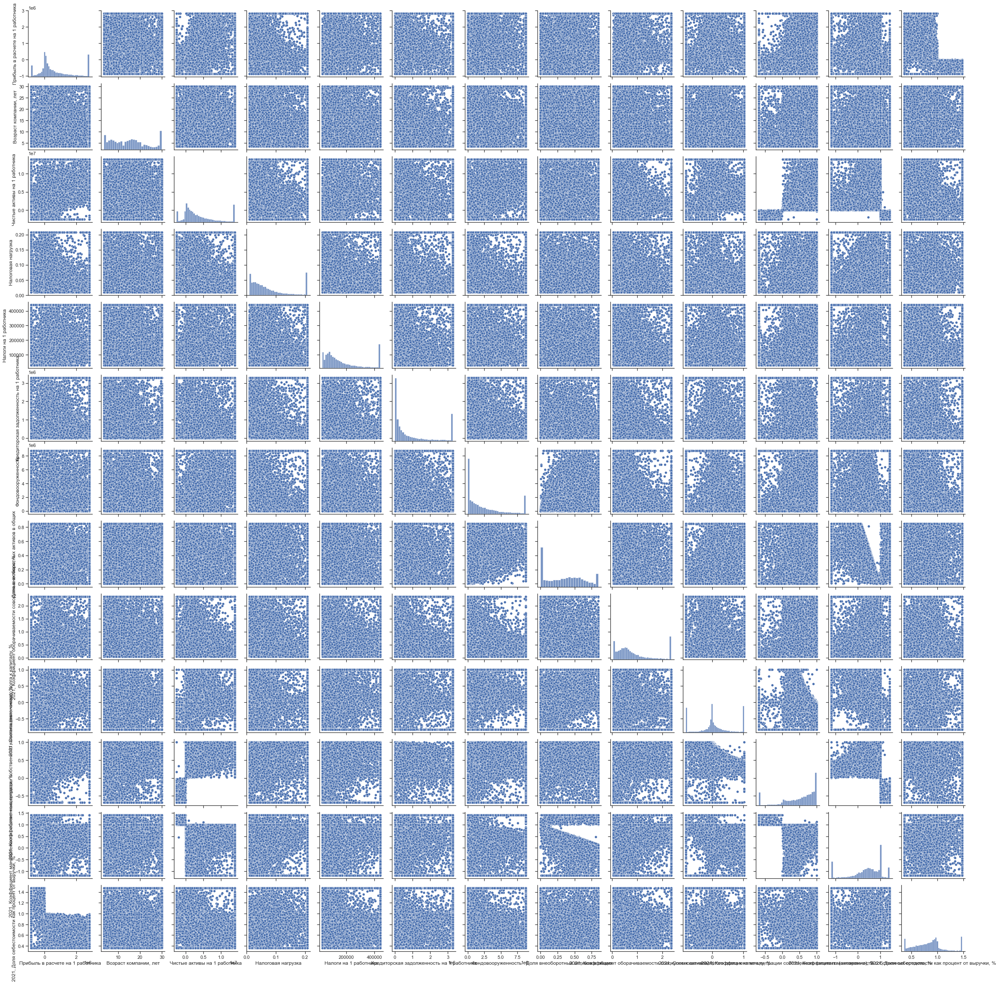

In [38]:
import seaborn as sns
sns.pairplot(data_all2)

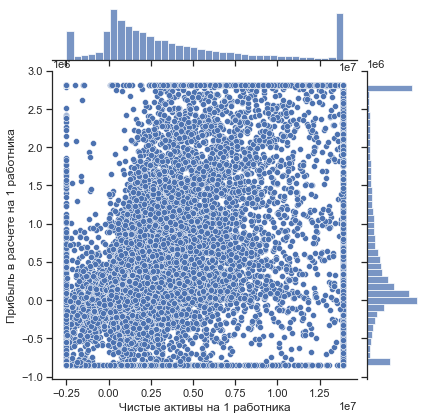

In [39]:
sns.jointplot(x='Чистые активы на 1 работника', y='Прибыль в расчете на 1 работника', data=data_all2)

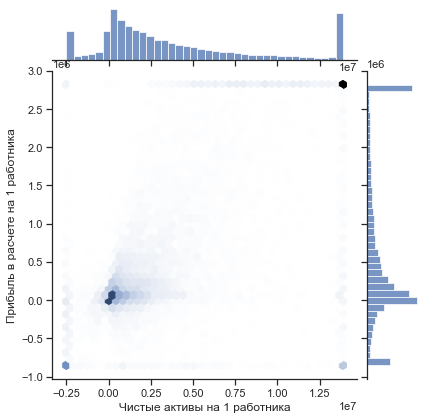

In [40]:
sns.jointplot(x='Чистые активы на 1 работника', y='Прибыль в расчете на 1 работника', data=data_all2, kind="hex")

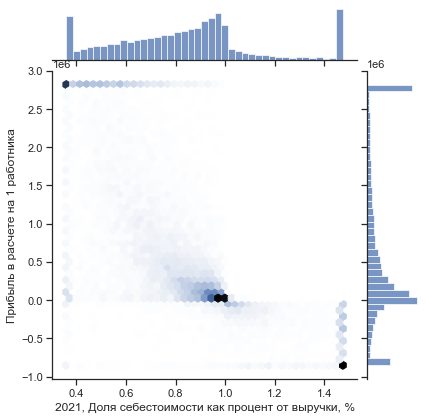

In [41]:
sns.jointplot(x='2021, Доля себестоимости как процент от выручки, %', y='Прибыль в расчете на 1 работника', data=data_all2, kind="hex")

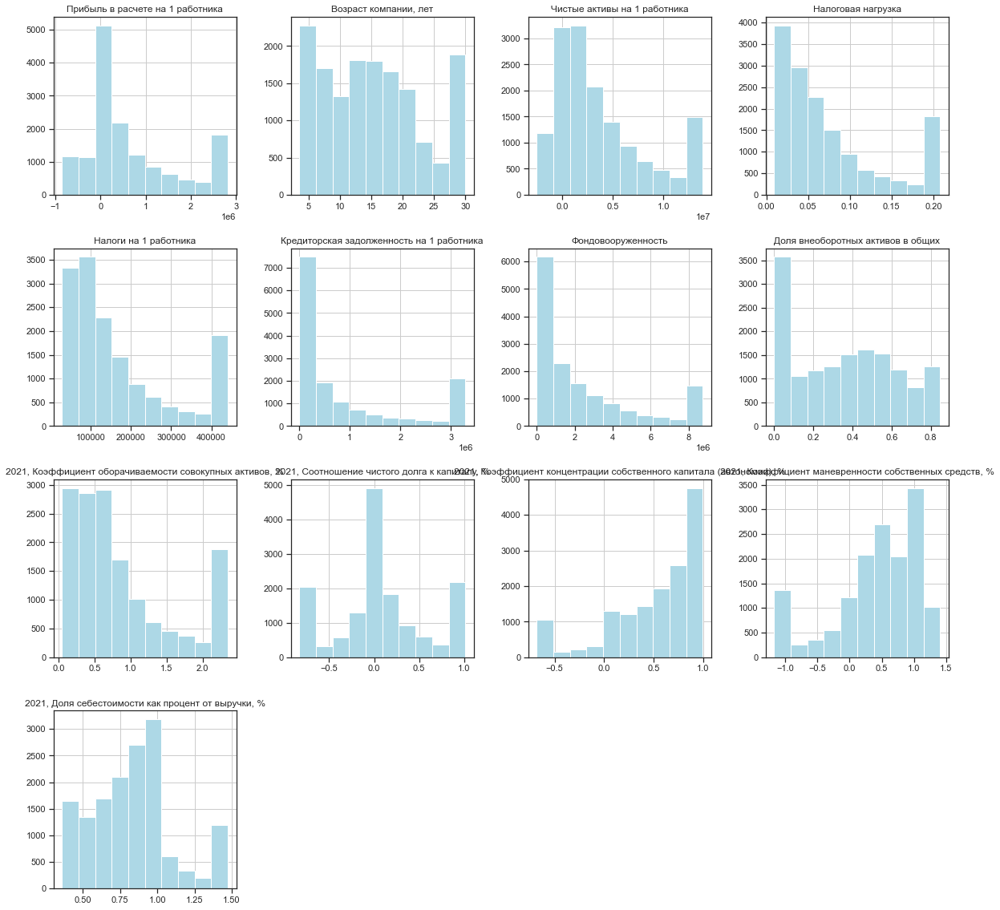

In [42]:
data_all2.hist(figsize = (20,20), color = "lightblue")
plt.show()

In [43]:
data_all2.shape

(15015, 13)

In [44]:
# Сохраним данные без масштабирования для ряда методов
data_all2.to_csv('Data_natural.csv')

## Масштабирование признаков

In [49]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import MaxAbsScaler

In [46]:
# DataFrame не содержащий целевой признак
X_ALL = data_all2.drop('Прибыль в расчете на 1 работника', axis=1)

In [47]:
# Функция для восстановления датафрейма
# на основе масштабированных данных
def arr_to_df(arr_scaled):
    res = pd.DataFrame(arr_scaled, columns=X_ALL.columns)
    return res

In [50]:
# Разделим выборку на обучающую и тестовую
X_train, X_test, y_train, y_test = train_test_split(X_ALL, data_all2['Прибыль в расчете на 1 работника'],
                                                    test_size=0.2,
                                                    random_state=1)

In [51]:
# Преобразуем массивы в DataFrame
X_train_df = arr_to_df(X_train)
X_test_df = arr_to_df(X_test)

X_train_df.shape, X_test_df.shape

((12012, 12), (3003, 12))

In [52]:
# Обучаем StandardScaler на всей выборке и масштабируем
cs11 = StandardScaler()
data_cs11_scaled_temp = cs11.fit_transform(X_ALL)
# формируем DataFrame на основе массива
data_cs11_scaled =  arr_to_df(data_cs11_scaled_temp)
data_cs11_scaled

,"Возраст компании, лет",Чистые активы на 1 работника,Налоговая нагрузка,Налоги на 1 работника,Кредиторская задолженность на 1 работника,Фондовооруженность,Доля внеоборотных активов в общих,"2021, Коэффициент оборачиваемости совокупных активов, %","2021, Соотношение чистого долга к капиталу, %","2021, Коэффициент концентрации собственного капитала (автономии), %","2021, Коэффициент маневренности собственных средств, %","2021, Доля себестоимости как процент от выручки, %"
0,-1.353316,-0.831599,1.605659,0.807043,1.405632,-0.878661,-1.341997,-0.771821,1.763112,-1.091447,0.867077,0.419062
1,-1.478899,-0.679091,-0.557184,-0.732142,-0.358235,-0.173472,1.214137,-0.230892,1.763112,-0.564423,-2.327763,1.102527
2,0.656008,-0.741132,0.345900,-0.547368,-0.600013,-0.878661,-1.341997,0.970906,-0.454933,0.313591,0.867077,0.399595
3,-0.976568,-0.390961,-0.764926,-0.098841,1.188904,-0.236715,-0.060563,0.791489,-0.123273,-0.259372,-0.428585,-0.321034
4,0.279260,-0.959434,2.146515,-0.399314,1.251872,0.133760,1.828022,-1.090769,-1.704478,-1.528951,1.468403,2.273373
...,...,...,...,...,...,...,...,...,...,...,...,...
15010,-0.097489,0.950631,0.538607,1.393128,-0.518665,0.332920,0.283637,-0.697686,0.100964,0.733707,0.115402,-1.143600
15011,-0.097489,0.117049,-0.303369,0.666600,0.125873,0.174177,0.256917,-0.302490,0.518825,0.217847,-0.161809,-1.425339
15012,0.216468,0.142101,-0.328315,2.118234,0.292457,0.217159,1.084440,-0.223281,1.763112,-0.267530,-1.610482,-1.413305
15013,-1.290525,2.230579,-1.056983,-0.440322,-0.723851,2.299190,0.920970,-0.242449,0.927296,0.178132,-0.634656,-1.542494


In [53]:
data_cs11_scaled.describe()

,"Возраст компании, лет",Чистые активы на 1 работника,Налоговая нагрузка,Налоги на 1 работника,Кредиторская задолженность на 1 работника,Фондовооруженность,Доля внеоборотных активов в общих,"2021, Коэффициент оборачиваемости совокупных активов, %","2021, Соотношение чистого долга к капиталу, %","2021, Коэффициент концентрации собственного капитала (автономии), %","2021, Коэффициент маневренности собственных средств, %","2021, Доля себестоимости как процент от выручки, %"
count,1.501500e+04,1.501500e+04,1.501500e+04,1.501500e+04,1.501500e+04,1.501500e+04,1.501500e+04,1.501500e+04,1.501500e+04,1.501500e+04,1.501500e+04,1.501500e+04
mean,-3.343165e-16,-1.129596e-16,2.718068e-16,-4.963396e-16,1.375597e-16,1.649593e-15,4.454941e-17,-1.029590e-16,3.408677e-17,-1.463143e-16,1.889782e-16,1.746189e-16
std,1.000033e+00,1.000033e+00,1.000033e+00,1.000033e+00,1.000033e+00,1.000033e+00,1.000033e+00,1.000033e+00,1.000033e+00,1.000033e+00,1.000033e+00,1.000033e+00
min,-1.478899e+00,-1.386953e+00,-1.056983e+00,-1.084915e+00,-7.924311e-01,-8.786612e-01,-1.341997e+00,-1.147610e+00,-1.704478e+00,-2.557291e+00,-2.327763e+00,-1.674020e+00
25%,-8.509853e-01,-7.157966e-01,-7.540539e-01,-7.294496e-01,-7.344307e-01,-8.066307e-01,-9.729089e-01,-7.163609e-01,-4.041319e-01,-5.426340e-01,-4.266008e-01,-6.997542e-01
50%,-3.469731e-02,-3.242941e-01,-3.424736e-01,-3.720412e-01,-5.041319e-01,-3.841599e-01,2.760206e-02,-3.257449e-01,-1.320995e-01,2.983491e-01,1.809568e-01,2.087513e-02
75%,6.560079e-01,4.627534e-01,4.061738e-01,4.096237e-01,3.900907e-01,4.356977e-01,7.784980e-01,4.129935e-01,4.627658e-01,8.004703e-01,8.408405e-01,4.894966e-01
max,1.849044e+00,2.230579e+00,2.146515e+00,2.118234e+00,2.076873e+00,2.299190e+00,1.828022e+00,2.107025e+00,1.763112e+00,1.043266e+00,1.468403e+00,2.273373e+00


In [68]:
# Построение плотности распределения
def draw_kde(col_list, df1, df2, label1, label2):
    fig, (ax1, ax2) = plt.subplots(
        ncols=2, figsize=(30, 15))
    # первый график
    ax1.set_title(label1)
    sns.kdeplot(data=df1[col_list], ax=ax1)
    # второй график
    ax2.set_title(label2)
    sns.kdeplot(data=df2[col_list], ax=ax2)
    plt.show()


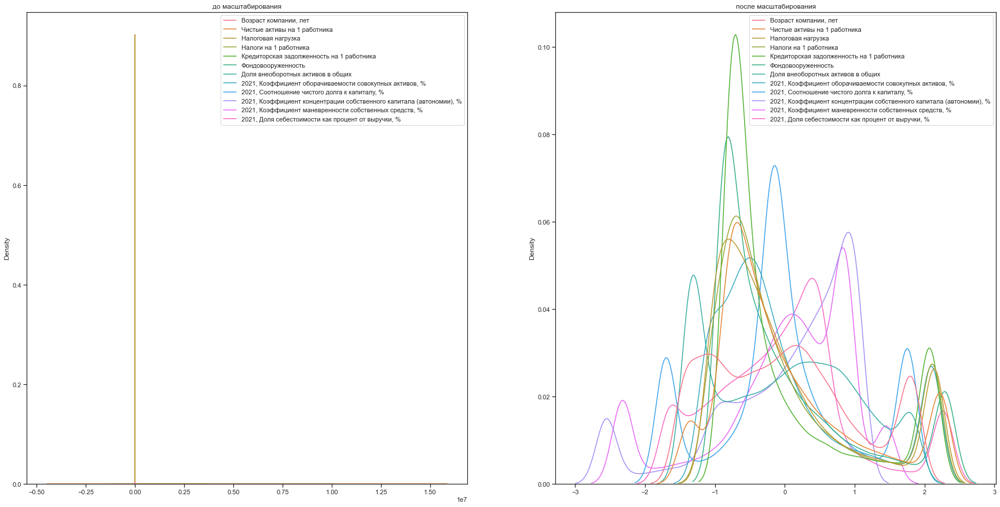

In [69]:
draw_kde(['Возраст компании, лет','Чистые активы на 1 работника', 'Налоговая нагрузка', 'Налоги на 1 работника','Кредиторская задолженность на 1 работника', 'Фондовооруженность','Доля внеоборотных активов в общих', '2021, Коэффициент оборачиваемости совокупных активов, %', '2021, Соотношение чистого долга к капиталу, %', '2021, Коэффициент концентрации собственного капитала (автономии), %', '2021, Коэффициент маневренности собственных средств, %', '2021, Доля себестоимости как процент от выручки, %'], data_all2, data_cs11_scaled, 'до масштабирования', 'после масштабирования')

In [70]:
# Обучаем StandardScaler на обучающей выборке 
# и масштабируем обучающую и тестовую выборки
cs12 = StandardScaler()
cs12.fit(X_train)
data_cs12_scaled_train_temp = cs12.transform(X_train)
data_cs12_scaled_test_temp = cs12.transform(X_test)
# формируем DataFrame на основе массива
data_cs12_scaled_train = arr_to_df(data_cs12_scaled_train_temp)
data_cs12_scaled_test = arr_to_df(data_cs12_scaled_test_temp)

In [71]:
data_cs12_scaled_train.describe()

,"Возраст компании, лет",Чистые активы на 1 работника,Налоговая нагрузка,Налоги на 1 работника,Кредиторская задолженность на 1 работника,Фондовооруженность,Доля внеоборотных активов в общих,"2021, Коэффициент оборачиваемости совокупных активов, %","2021, Соотношение чистого долга к капиталу, %","2021, Коэффициент концентрации собственного капитала (автономии), %","2021, Коэффициент маневренности собственных средств, %","2021, Доля себестоимости как процент от выручки, %"
count,1.201200e+04,1.201200e+04,1.201200e+04,1.201200e+04,1.201200e+04,1.201200e+04,1.201200e+04,1.201200e+04,1.201200e+04,1.201200e+04,1.201200e+04,1.201200e+04
mean,9.242616e-19,1.786783e-16,6.766981e-17,7.967135e-17,5.841333e-18,-2.709935e-17,2.389031e-16,-1.464030e-16,1.649252e-16,5.438355e-17,-2.915121e-17,-5.816424e-16
std,1.000042e+00,1.000042e+00,1.000042e+00,1.000042e+00,1.000042e+00,1.000042e+00,1.000042e+00,1.000042e+00,1.000042e+00,1.000042e+00,1.000042e+00,1.000042e+00
min,-1.480545e+00,-1.389562e+00,-1.058311e+00,-1.087961e+00,-7.931900e-01,-8.785309e-01,-1.341172e+00,-1.150025e+00,-1.711623e+00,-2.570119e+00,-2.330450e+00,-1.673568e+00
25%,-8.518955e-01,-7.196779e-01,-7.548697e-01,-7.298226e-01,-7.338777e-01,-8.068322e-01,-9.725371e-01,-7.185962e-01,-3.982674e-01,-5.453973e-01,-4.271985e-01,-7.022872e-01
50%,-3.465109e-02,-3.243933e-01,-3.431995e-01,-3.714629e-01,-4.982391e-01,-3.855240e-01,2.630619e-02,-3.260902e-01,-1.351640e-01,2.980211e-01,1.815008e-01,1.983480e-02
75%,6.568634e-01,4.713867e-01,4.111229e-01,4.141102e-01,3.754794e-01,4.383632e-01,7.769525e-01,4.158078e-01,4.639131e-01,7.982699e-01,8.434134e-01,4.845353e-01
max,1.851298e+00,2.217003e+00,2.135279e+00,2.107948e+00,2.074957e+00,2.287183e+00,1.824865e+00,2.108894e+00,1.758335e+00,1.047559e+00,1.468713e+00,2.264592e+00


In [72]:
data_cs12_scaled_test.describe()

,"Возраст компании, лет",Чистые активы на 1 работника,Налоговая нагрузка,Налоги на 1 работника,Кредиторская задолженность на 1 работника,Фондовооруженность,Доля внеоборотных активов в общих,"2021, Коэффициент оборачиваемости совокупных активов, %","2021, Соотношение чистого долга к капиталу, %","2021, Коэффициент концентрации собственного капитала (автономии), %","2021, Коэффициент маневренности собственных средств, %","2021, Доля себестоимости как процент от выручки, %"
count,3003.000000,3003.000000,3003.000000,3003.000000,3003.000000,3003.000000,3003.000000,3003.000000,3003.000000,3003.000000,3003.000000,3003.000000
mean,0.000434,-0.034066,-0.022987,-0.027491,-0.005392,-0.016129,-0.004304,-0.004523,-0.029906,-0.003341,-0.004246,-0.017317
std,1.006012,0.984441,0.984388,0.988506,0.998137,0.980811,0.993860,1.006722,1.003220,1.023721,1.004102,0.988294
min,-1.480545,-1.389562,-1.058311,-1.087961,-0.793190,-0.878531,-1.341172,-1.150025,-1.711623,-2.570119,-2.330450,-1.673568
25%,-0.851896,-0.724349,-0.761169,-0.744089,-0.740071,-0.806246,-0.973213,-0.716656,-0.458030,-0.555697,-0.428081,-0.697344
50%,-0.034651,-0.345955,-0.359607,-0.407149,-0.529284,-0.387704,0.029373,-0.332300,-0.146816,0.301257,0.171424,-0.000646
75%,0.656863,0.397996,0.340554,0.361001,0.448653,0.400969,0.773982,0.401695,0.418669,0.821080,0.832271,0.488066
max,1.851298,2.217003,2.135279,2.107948,2.074957,2.287183,1.824865,2.108894,1.758335,1.047559,1.468713,2.264592


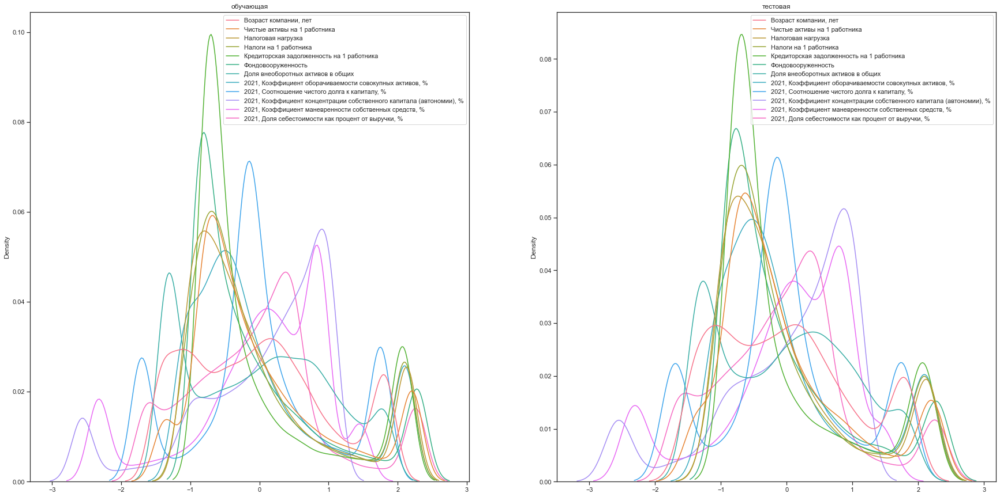

In [73]:
# распределения для обучающей и тестовой выборки немного отличаются
draw_kde(['Возраст компании, лет','Чистые активы на 1 работника', 'Налоговая нагрузка', 'Налоги на 1 работника','Кредиторская задолженность на 1 работника', 'Фондовооруженность','Доля внеоборотных активов в общих', '2021, Коэффициент оборачиваемости совокупных активов, %', '2021, Соотношение чистого долга к капиталу, %', '2021, Коэффициент концентрации собственного капитала (автономии), %', '2021, Коэффициент маневренности собственных средств, %', '2021, Доля себестоимости как процент от выручки, %'], data_cs12_scaled_train, data_cs12_scaled_test, 'обучающая', 'тестовая')

In [81]:
# Сохраним данные 
data_cs12_scaled_train.to_csv('data_cs12_scaled_train.csv')
data_cs12_scaled_test.to_csv('data_cs12_scaled_test.csv')


In [74]:
class MeanNormalisation:
    
    def fit(self, param_df):
        self.means = X_train.mean(axis=0)
        maxs = X_train.max(axis=0)
        mins = X_train.min(axis=0)
        self.ranges = maxs - mins

    def transform(self, param_df):
        param_df_scaled = (param_df - self.means) / self.ranges
        return param_df_scaled
    
    def fit_transform(self, param_df):
        self.fit(param_df)
        return self.transform(param_df)

sc21 = MeanNormalisation()
data_cs21_scaled = sc21.fit_transform(X_ALL)
data_cs21_scaled.describe()

,"Возраст компании, лет",Чистые активы на 1 работника,Налоговая нагрузка,Налоги на 1 работника,Кредиторская задолженность на 1 работника,Фондовооруженность,Доля внеоборотных активов в общих,"2021, Коэффициент оборачиваемости совокупных активов, %","2021, Соотношение чистого долга к капиталу, %","2021, Коэффициент концентрации собственного капитала (автономии), %","2021, Коэффициент маневренности собственных средств, %","2021, Доля себестоимости как процент от выручки, %"
count,15015.000000,15015.000000,15015.000000,15015.000000,15015.000000,15015.000000,15015.000000,15015.000000,15015.000000,15015.000000,15015.000000,15015.000000
mean,0.000026,-0.001889,-0.001440,-0.001720,-0.000376,-0.001019,-0.000272,-0.000278,-0.001724,-0.000185,-0.000224,-0.000879
std,0.300496,0.276441,0.312169,0.312203,0.348528,0.314689,0.315466,0.307264,0.288394,0.277744,0.263432,0.253340
min,-0.444362,-0.385287,-0.331386,-0.340423,-0.276551,-0.277514,-0.423612,-0.352885,-0.493269,-0.710433,-0.613411,-0.424962
25%,-0.255683,-0.199758,-0.236824,-0.229449,-0.256337,-0.254848,-0.307181,-0.220382,-0.118269,-0.150893,-0.112600,-0.178149
50%,-0.010400,-0.091534,-0.108346,-0.117869,-0.176074,-0.121906,0.008435,-0.100364,-0.039819,0.082677,0.047445,0.004409
75%,0.197147,0.126031,0.125351,0.126161,0.135577,0.136086,0.245310,0.126616,0.131731,0.222134,0.221274,0.123126
max,0.555638,0.614713,0.668614,0.659577,0.723449,0.722486,0.576388,0.647115,0.506731,0.289567,0.386589,0.575038


In [75]:
cs22 = MeanNormalisation()
cs22.fit(X_train)
data_cs22_scaled_train = cs22.transform(X_train)
data_cs22_scaled_test = cs22.transform(X_test)

In [76]:
data_cs22_scaled_train.describe()

,"Возраст компании, лет",Чистые активы на 1 работника,Налоговая нагрузка,Налоги на 1 работника,Кредиторская задолженность на 1 работника,Фондовооруженность,Доля внеоборотных активов в общих,"2021, Коэффициент оборачиваемости совокупных активов, %","2021, Соотношение чистого долга к капиталу, %","2021, Коэффициент концентрации собственного капитала (автономии), %","2021, Коэффициент маневренности собственных средств, %","2021, Доля себестоимости как процент от выручки, %"
count,1.201200e+04,1.201200e+04,1.201200e+04,1.201200e+04,1.201200e+04,1.201200e+04,1.201200e+04,1.201200e+04,1.201200e+04,1.201200e+04,1.201200e+04,1.201200e+04
mean,6.668547e-18,-5.909692e-15,-5.628370e-15,3.192677e-16,3.057088e-16,2.324393e-15,-2.936472e-16,1.079156e-14,4.149750e-16,5.358568e-16,2.792097e-15,1.327958e-14
std,3.001467e-01,2.772837e-01,3.131402e-01,3.129131e-01,3.486716e-01,3.158977e-01,3.158654e-01,3.068631e-01,2.881999e-01,2.764319e-01,2.632268e-01,2.539363e-01
min,-4.443622e-01,-3.852868e-01,-3.313861e-01,-3.404230e-01,-2.765514e-01,-2.775143e-01,-4.236123e-01,-3.528854e-01,-4.932691e-01,-7.104334e-01,-6.134115e-01,-4.249618e-01
25%,-2.556830e-01,-1.995466e-01,-2.363702e-01,-2.283615e-01,-2.558717e-01,-2.548658e-01,-3.071781e-01,-2.205015e-01,-1.147759e-01,-1.507589e-01,-1.124454e-01,-1.783287e-01
50%,-1.039998e-02,-8.994523e-02,-1.074651e-01,-1.162308e-01,-1.737146e-01,-1.217811e-01,8.308869e-03,-1.000609e-01,-3.895263e-02,8.237912e-02,4.777388e-02,5.036565e-03
75%,1.971472e-01,1.307024e-01,1.287338e-01,1.295751e-01,1.309136e-01,1.384722e-01,2.454022e-01,1.275908e-01,1.336941e-01,2.206581e-01,2.219998e-01,1.230360e-01
max,5.556378e-01,6.147132e-01,6.686139e-01,6.595770e-01,7.234486e-01,7.224857e-01,5.763877e-01,6.471146e-01,5.067309e-01,2.895666e-01,3.865885e-01,5.750382e-01


In [77]:
data_cs22_scaled_test.describe()

,"Возраст компании, лет",Чистые активы на 1 работника,Налоговая нагрузка,Налоги на 1 работника,Кредиторская задолженность на 1 работника,Фондовооруженность,Доля внеоборотных активов в общих,"2021, Коэффициент оборачиваемости совокупных активов, %","2021, Соотношение чистого долга к капиталу, %","2021, Коэффициент концентрации собственного капитала (автономии), %","2021, Коэффициент маневренности собственных средств, %","2021, Доля себестоимости как процент от выручки, %"
count,3003.000000,3003.000000,3003.000000,3003.000000,3003.000000,3003.000000,3003.000000,3003.000000,3003.000000,3003.000000,3003.000000,3003.000000
mean,0.000130,-0.009446,-0.007198,-0.008602,-0.001880,-0.005095,-0.001359,-0.001388,-0.008618,-0.000924,-0.001118,-0.004397
std,0.301939,0.272958,0.308239,0.309304,0.348008,0.309823,0.313913,0.308913,0.289116,0.282977,0.264296,0.250953
min,-0.444362,-0.385287,-0.331386,-0.340423,-0.276551,-0.277514,-0.423612,-0.352885,-0.493269,-0.710433,-0.613411,-0.424962
25%,-0.255683,-0.200842,-0.238343,-0.232826,-0.258031,-0.254681,-0.307392,-0.219906,-0.131999,-0.153606,-0.112678,-0.177073
50%,-0.010400,-0.095924,-0.112603,-0.127397,-0.184539,-0.122470,0.009277,-0.101966,-0.042311,0.083273,0.045122,-0.000164
75%,0.197147,0.110353,0.106637,0.112957,0.156426,0.126660,0.244464,0.123260,0.120655,0.226963,0.219067,0.123933
max,0.555638,0.614713,0.668614,0.659577,0.723449,0.722486,0.576388,0.647115,0.506731,0.289567,0.386589,0.575038


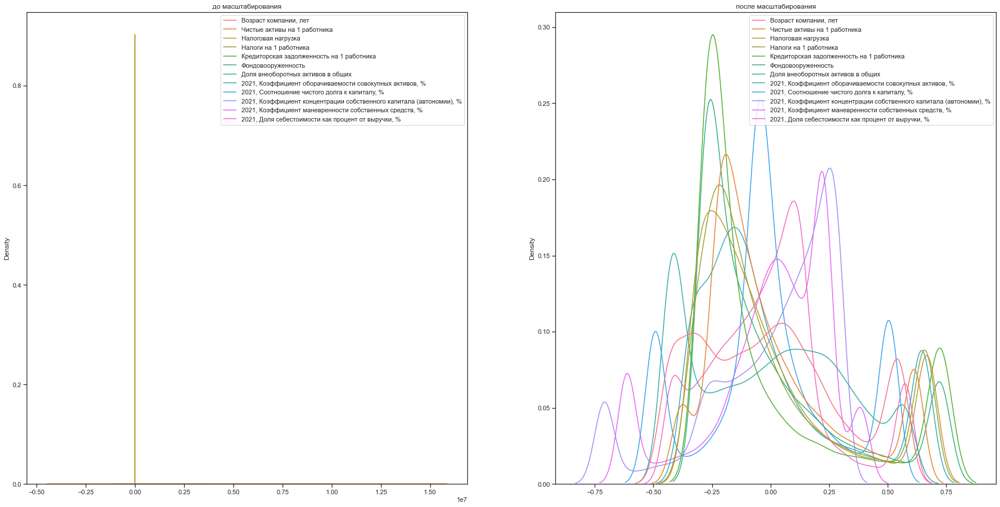

In [79]:
draw_kde(['Возраст компании, лет','Чистые активы на 1 работника', 'Налоговая нагрузка', 'Налоги на 1 работника','Кредиторская задолженность на 1 работника', 'Фондовооруженность','Доля внеоборотных активов в общих', '2021, Коэффициент оборачиваемости совокупных активов, %', '2021, Соотношение чистого долга к капиталу, %', '2021, Коэффициент концентрации собственного капитала (автономии), %', '2021, Коэффициент маневренности собственных средств, %', '2021, Доля себестоимости как процент от выручки, %'], data_all2, data_cs21_scaled, 'до масштабирования', 'после масштабирования')

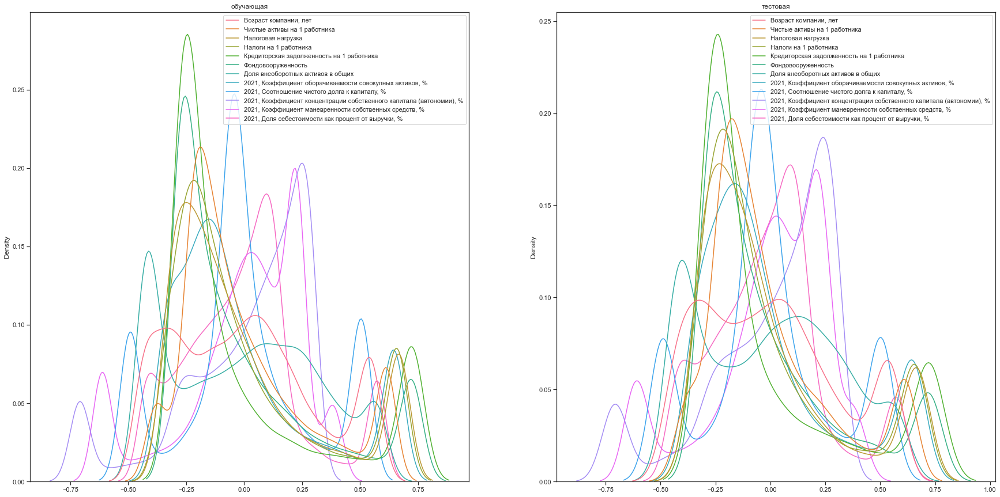

In [80]:
draw_kde(['Возраст компании, лет','Чистые активы на 1 работника', 'Налоговая нагрузка', 'Налоги на 1 работника','Кредиторская задолженность на 1 работника', 'Фондовооруженность','Доля внеоборотных активов в общих', '2021, Коэффициент оборачиваемости совокупных активов, %', '2021, Соотношение чистого долга к капиталу, %', '2021, Коэффициент концентрации собственного капитала (автономии), %', '2021, Коэффициент маневренности собственных средств, %', '2021, Доля себестоимости как процент от выручки, %'], data_cs22_scaled_train, data_cs22_scaled_test, 'обучающая', 'тестовая')

In [83]:
# Сохраним данные 
data_cs22_scaled_train.to_csv('data_cs22_scaled_train.csv')
data_cs22_scaled_test.to_csv('data_cs22_scaled_test.csv')
y_train.to_csv('data_cs22_scaled_train_y.csv')
y_test.to_csv('data_cs22_scaled_test_y.csv')


In [84]:
data_cs22_scaled_train.shape

(12012, 12)

In [85]:
data_cs22_scaled_test.shape

(3003, 12)

In [86]:
y_test.shape

(3003,)